# Background summary on data collection method:

 Two kinds of devices:

1) Smartphone (Samsung Galaxy S5)

2) Smartwatch (LG G)

Two kinds of embedded kinematic sensors (for each device):

1) Accelerometer - for measurement of linear acceleration (m/sec^2)


Exploratory Data Analysis of raw data 

(time series sensors data)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
activity_codes_mapping = {'A': 'walking',
                          'B': 'jogging',
                          'C': 'stairs',
                          'D': 'sitting',
                          'E': 'standing',
                          'F': 'typing',
                          'G': 'brushing teeth',
                          'H': 'eating soup',
                          'I': 'eating chips',
                          'J': 'eating pasta',
                          'K': 'drinking from cup',
                          'L': 'eating sandwich',
                          'M': 'kicking soccer ball',
                          'O': 'playing catch tennis ball',
                          'P': 'dribbling basket ball',
                          'Q': 'writing',
                          'R': 'clapping',
                          'S': 'folding clothes'}

In [ ]:
activity_color_map = {activity_codes_mapping['A']: 'lime',
                      activity_codes_mapping['B']: 'red',
                      activity_codes_mapping['C']: 'blue',
                      activity_codes_mapping['D']: 'orange',
                      activity_codes_mapping['E']: 'yellow',
                      activity_codes_mapping['F']: 'lightgreen',
                      activity_codes_mapping['G']: 'greenyellow',
                      activity_codes_mapping['H']: 'magenta',
                      activity_codes_mapping['I']: 'gold',
                      activity_codes_mapping['J']: 'cyan',
                      activity_codes_mapping['K']: 'purple',
                      activity_codes_mapping['L']: 'lightgreen',
                      activity_codes_mapping['M']: 'violet',
                      activity_codes_mapping['O']: 'limegreen',
                      activity_codes_mapping['P']: 'deepskyblue',   
                      activity_codes_mapping['Q']: 'mediumspringgreen',
                      activity_codes_mapping['R']: 'plum',
                      activity_codes_mapping['S']: 'olive'}

In [ ]:
def show_accel_per_activity(device, df, act, interval_in_sec = None):
  ''' Plots acceleration time history per activity '''

  df1 = df.loc[df.activity == act].copy()
  df1.reset_index(drop = True, inplace = True)

  df1['duration'] = (df1['timestamp'] - df1['timestamp'].iloc[0])/1000000000 # nanoseconds --> seconds

  if interval_in_sec == None:
    ax = df1[:].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)
  else:
    ax = df1[:interval_in_sec*20].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)

  ax.set_xlabel('duration  (sec)', fontsize = 15)
  ax.set_ylabel('acceleration  (m/sec^2)',fontsize = 15)
  ax.set_title('Acceleration:   Device: ' + device + '      Activity:  ' + act, fontsize = 15)

In [ ]:
def show_ang_velocity_per_activity(device, df, act, interval_in_sec = None):
  ''' Plots angular volocity time history per activity '''

  df1 = df.loc[df.activity == act].copy()
  df1.reset_index(drop = True, inplace = True)

  df1['duration'] = (df1['timestamp'] - df1['timestamp'].iloc[0])/1000000000 # nanoseconds --> seconds

  if interval_in_sec == None:
    ax = df1[:].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)
  else:
    ax = df1[:interval_in_sec*20].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)

  ax.set_xlabel('duration  (sec)', fontsize = 15)
  ax.set_ylabel('angular velocity  (rad/sec)',fontsize = 15)
  ax.set_title('Angular velocity:  Device: ' + device + '      Activity:  ' + act, fontsize = 15)

In [ ]:
raw_par_10_phone_accel = pd.read_csv('/content/drive/MyDrive/IACSD/wisdm-dataset/raw/phone/accel/data_1610_accel_phone.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)


In [ ]:
raw_par_10_phone_accel.head()

,participant_id,activity_code,timestamp,x,y,z
0,1610,A,18687441561967,1.174957,13.347473,-4.0346375;
1,1610,A,18687491915971,1.408188,7.091858,-3.8957214;
2,1610,A,18687542269974,4.932510,6.306808,-2.3390045;
3,1610,A,18687592623978,0.154648,6.123505,-1.8314667;
4,1610,A,18687642977982,-2.826035,4.180542,-3.2118988;


In [ ]:
raw_par_10_phone_accel.z = raw_par_10_phone_accel.z.str.strip(';')
raw_par_10_phone_accel.z.head()

0    -4.0346375
1    -3.8957214
2    -2.3390045
3    -1.8314667
4    -3.2118988
Name: z, dtype: object

In [ ]:
raw_par_10_phone_accel.z = pd.to_numeric(raw_par_10_phone_accel.z)

raw_par_10_phone_accel['activity'] = raw_par_10_phone_accel['activity_code'].map(activity_codes_mapping)

raw_par_10_phone_accel = raw_par_10_phone_accel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_10_phone_accel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1610,A,walking,18687441561967,1.174957,13.347473,-4.034637
1,1610,A,walking,18687491915971,1.408188,7.091858,-3.895721
2,1610,A,walking,18687542269974,4.932510,6.306808,-2.339005
3,1610,A,walking,18687592623978,0.154648,6.123505,-1.831467
4,1610,A,walking,18687642977982,-2.826035,4.180542,-3.211899
...,...,...,...,...,...,...,...
80865,1610,S,folding clothes,17989031516129,5.946732,7.583008,-1.097260
80866,1610,S,folding clothes,17989081870133,5.818741,7.804871,-1.623733
80867,1610,S,folding clothes,17989132224137,5.530823,7.636093,-1.662643
80868,1610,S,folding clothes,17989182578141,5.802170,7.645752,-1.000412


In [ ]:
raw_par_10_phone_accel.shape

(80870, 7)

In [ ]:
raw_par_10_phone_accel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80870 entries, 0 to 80869
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   participant_id  80870 non-null  int64  
 1   activity_code   80870 non-null  object 
 2   activity        80870 non-null  object 
 3   timestamp       80870 non-null  int64  
 4   x               80870 non-null  float64
 5   y               80870 non-null  float64
 6   z               80870 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 4.3+ MB


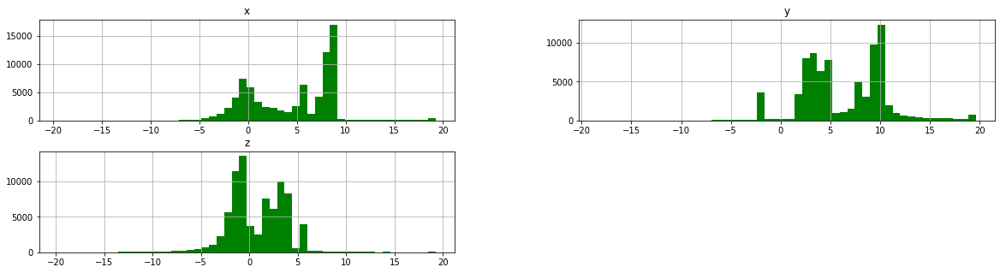

In [ ]:
#T = raw_par_10_phone_accel.iloc[:200]
T = raw_par_10_phone_accel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')
#T.hist(column='x', by='activity')

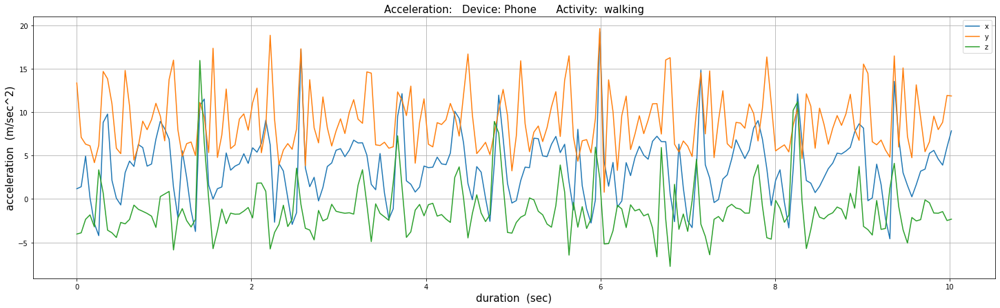

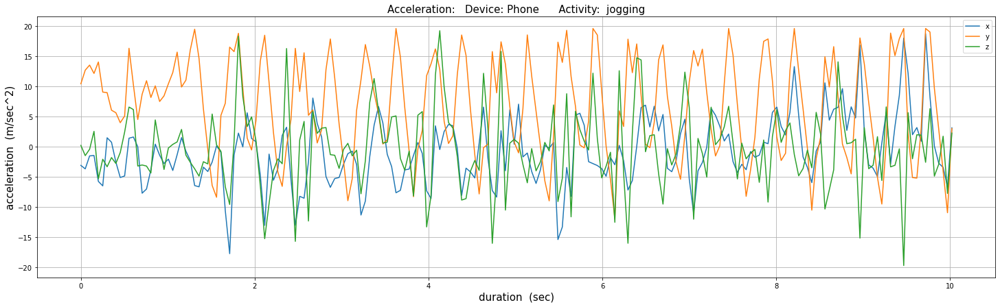

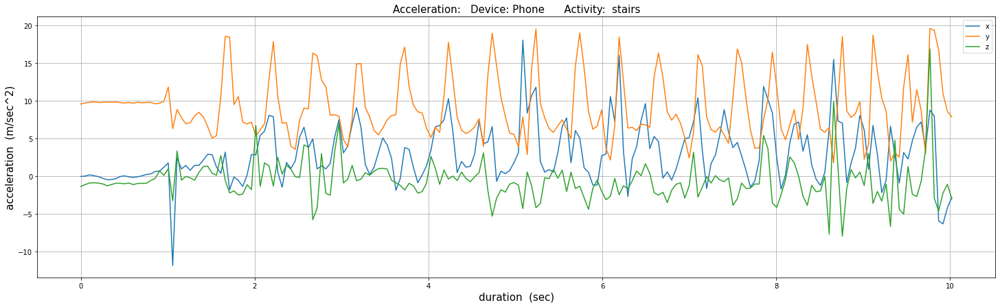

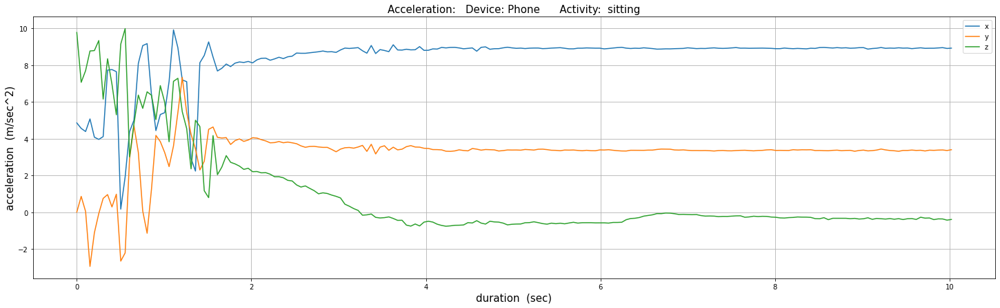

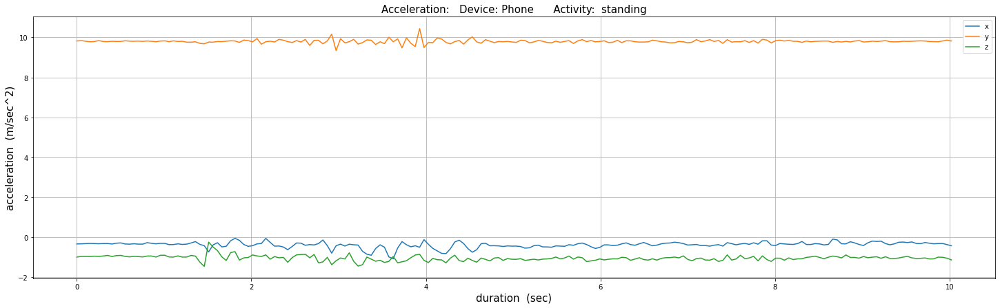

...

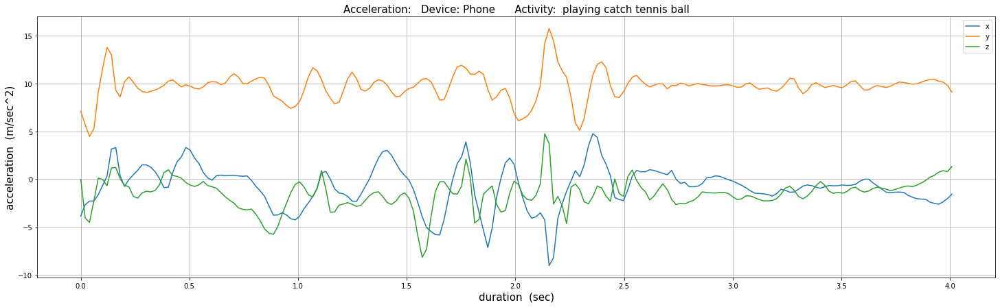

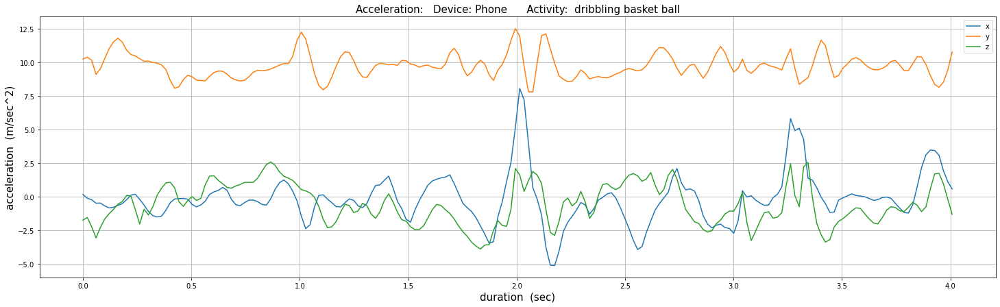

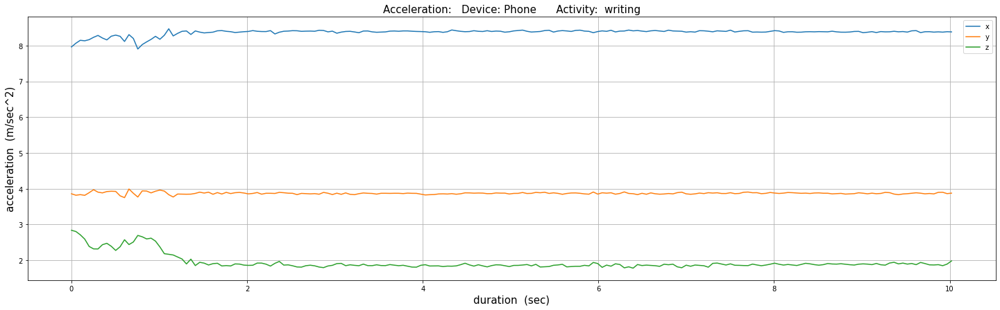

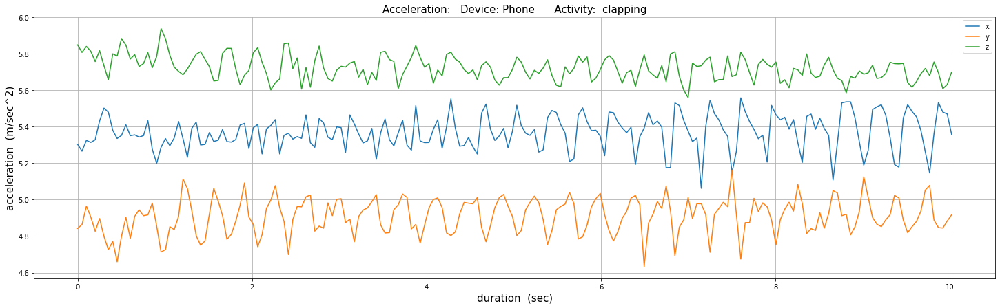

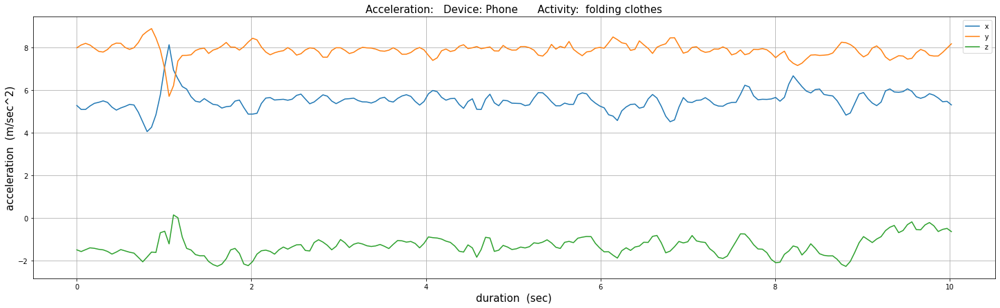

In [ ]:
for key in activity_codes_mapping:
  show_accel_per_activity('Phone', raw_par_10_phone_accel, activity_codes_mapping[key], 10)

In [ ]:

raw_par_20_watch_accel = pd.read_csv('/content/drive/MyDrive/IACSD/wisdm-dataset/raw/watch/accel/data_1620_accel_watch.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_20_watch_accel.z = raw_par_20_watch_accel.z.str.strip(';')
raw_par_20_watch_accel.z = pd.to_numeric(raw_par_20_watch_accel.z)

raw_par_20_watch_accel['activity'] = raw_par_20_watch_accel['activity_code'].map(activity_codes_mapping)

raw_par_20_watch_accel = raw_par_20_watch_accel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_20_watch_accel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1620,A,walking,37945621841814,3.417424,-2.164957,-4.849306
1,1620,A,walking,37945671341814,5.423765,-6.936601,-4.954651
2,1620,A,walking,37945720841814,4.700716,-3.127426,-7.648128
3,1620,A,walking,37945770341814,8.033444,-4.700417,-5.024083
4,1620,A,walking,37945819841814,3.970484,-1.645415,-3.621080
...,...,...,...,...,...,...,...
67189,1620,S,folding clothes,42368439960621,6.524798,-4.589834,0.573262
67190,1620,S,folding clothes,42368489889911,9.100959,-4.168455,-0.602291
67191,1620,S,folding clothes,42368539819201,7.590218,-5.736657,-1.854459
67192,1620,S,folding clothes,42368589748491,8.681973,-6.284929,-5.180005


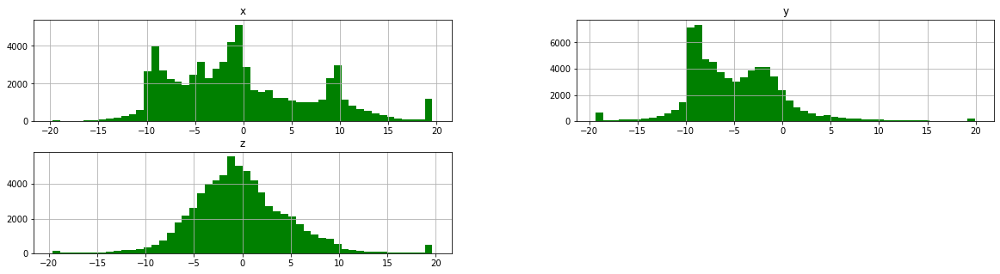

In [ ]:
#T = raw_par_20_watch_accel.iloc[:200]
T = raw_par_20_watch_accel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

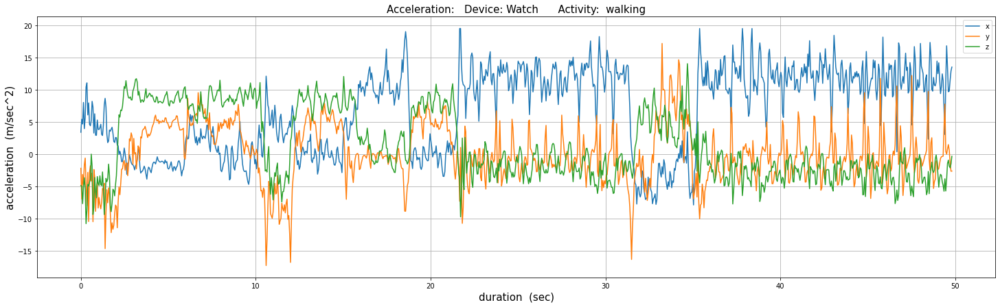

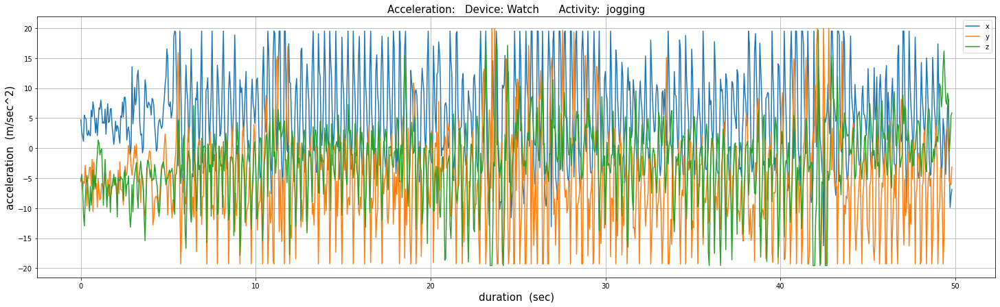

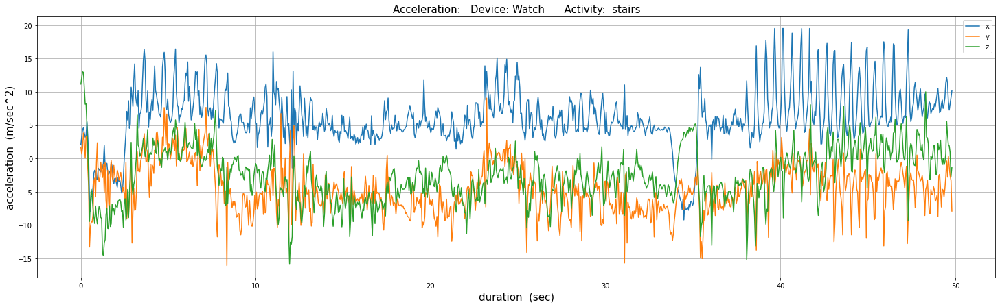

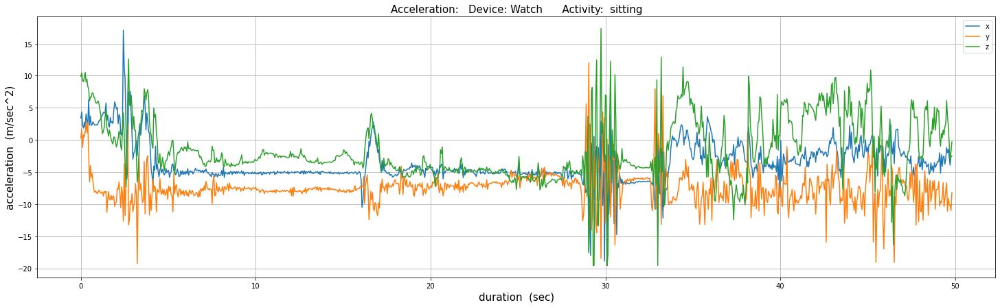

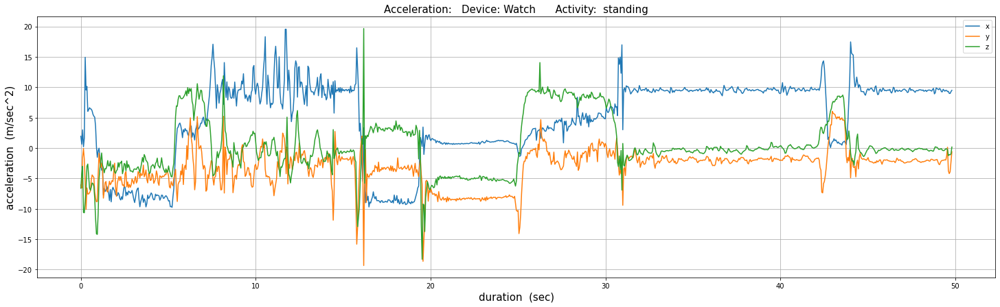

...

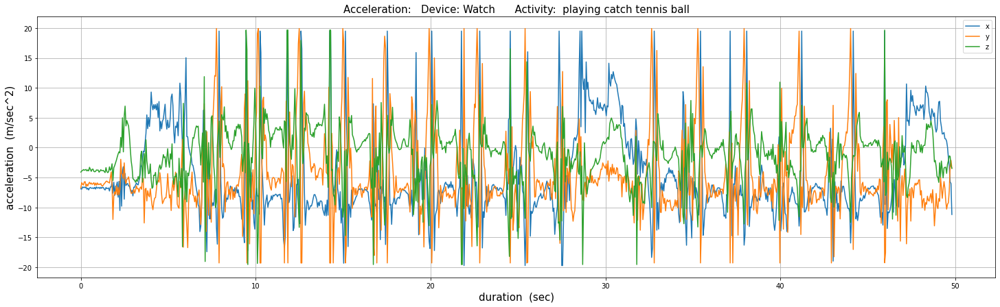

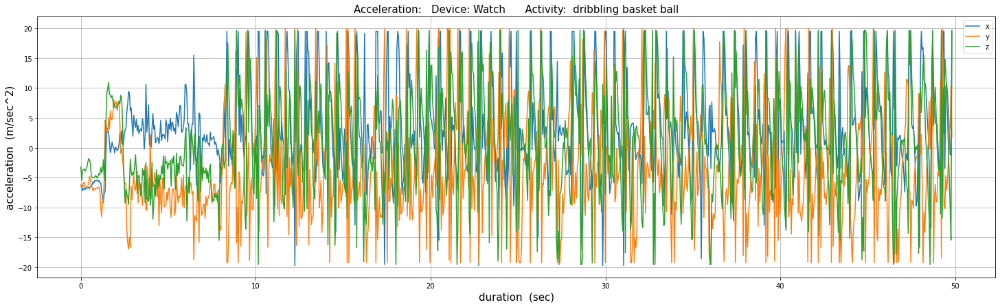

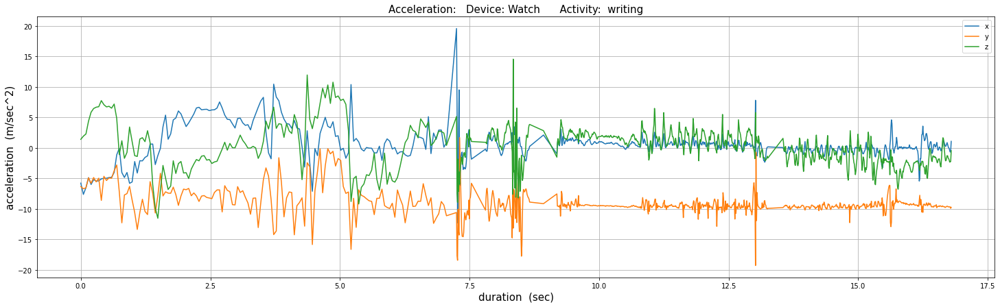

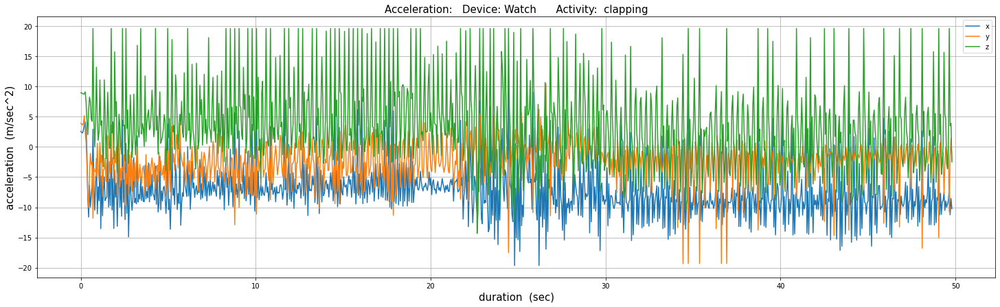

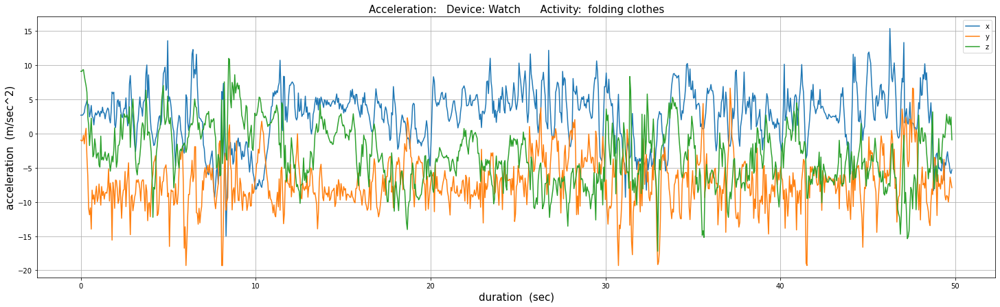

In [ ]:
for key in activity_codes_mapping:
  show_accel_per_activity('Watch', raw_par_20_watch_accel, activity_codes_mapping[key], 50)

In [ ]:
raw_par_35_phone_ang_vel = pd.read_csv('/content/drive/MyDrive/IACSD/wisdm-dataset/raw/phone/gyro/data_1635_gyro_phone.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_35_phone_ang_vel.z = raw_par_35_phone_ang_vel.z.str.strip(';')
raw_par_35_phone_ang_vel.z = pd.to_numeric(raw_par_35_phone_ang_vel.z)

raw_par_35_phone_ang_vel['activity'] = raw_par_35_phone_ang_vel['activity_code'].map(activity_codes_mapping)

raw_par_35_phone_ang_vel = raw_par_35_phone_ang_vel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_35_phone_ang_vel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1635,A,walking,676165107876419,0.874725,-0.098099,0.807510
1,1635,A,walking,676165158230423,0.563431,-1.359665,1.432419
2,1635,A,walking,676165208584427,1.507690,-3.086883,0.679016
3,1635,A,walking,676165258938431,1.430603,-1.860306,0.451035
4,1635,A,walking,676165309292435,0.325165,-1.735611,0.252365
...,...,...,...,...,...,...,...
64530,1635,S,folding clothes,680277872380268,-0.119614,-0.032928,0.129654
64531,1635,S,folding clothes,680277922750286,-0.500427,-0.465652,0.098923
64532,1635,S,folding clothes,680277973104290,-0.768646,-0.448929,0.063583
64533,1635,S,folding clothes,680278023458294,-0.786408,-0.346924,0.099899


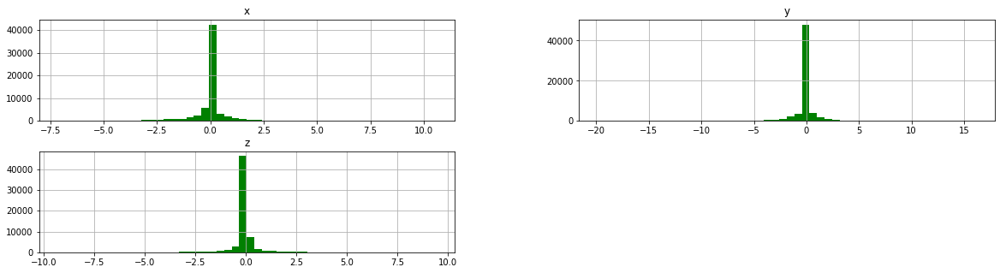

In [ ]:
T = raw_par_35_phone_ang_vel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

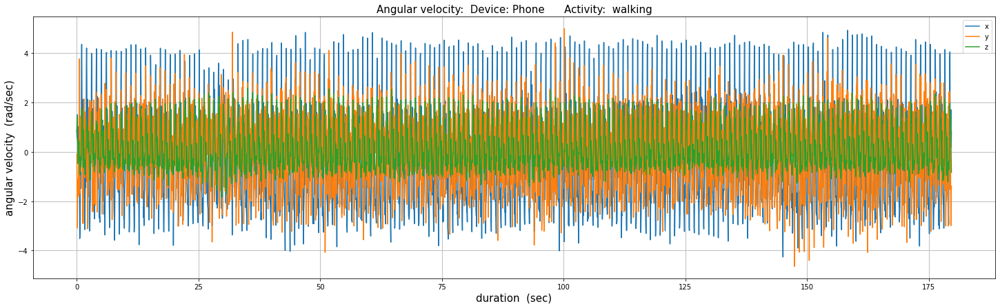

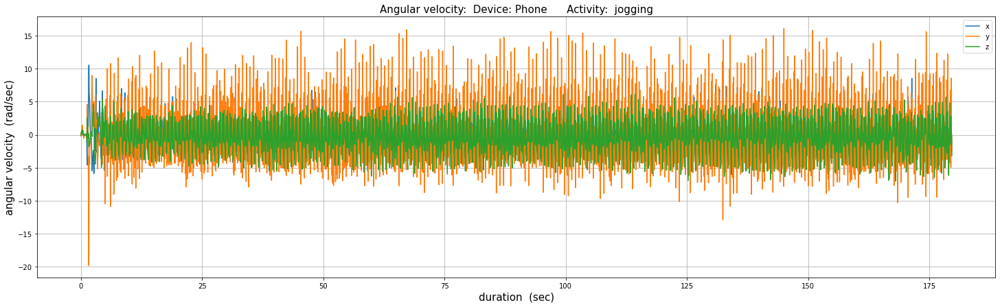

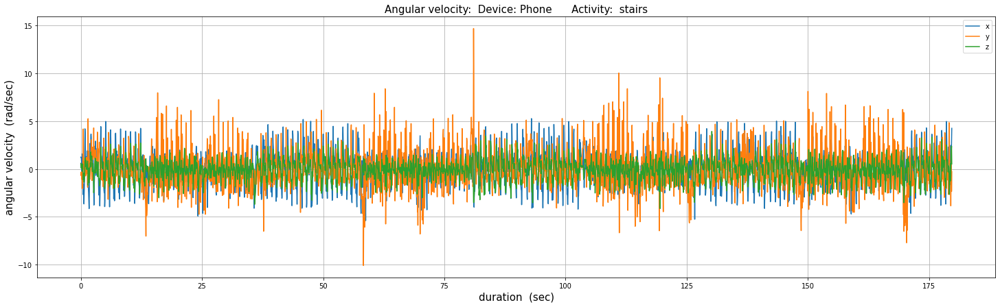

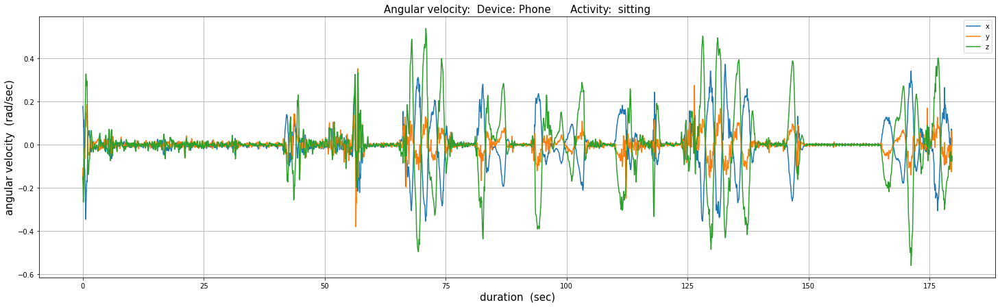

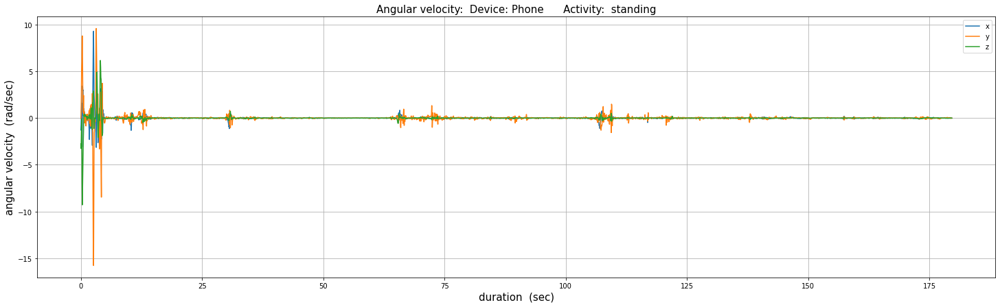

...

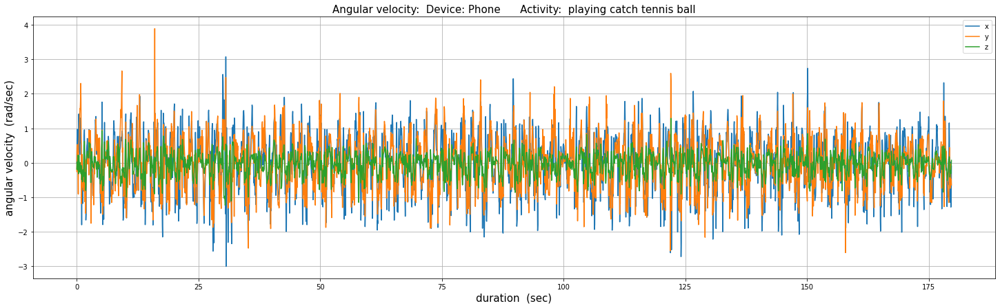

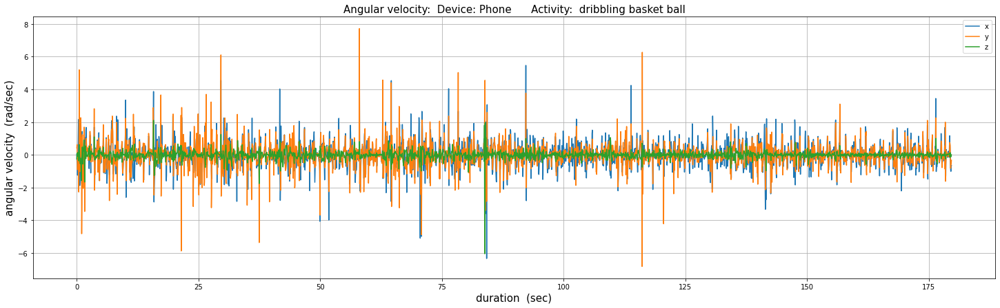

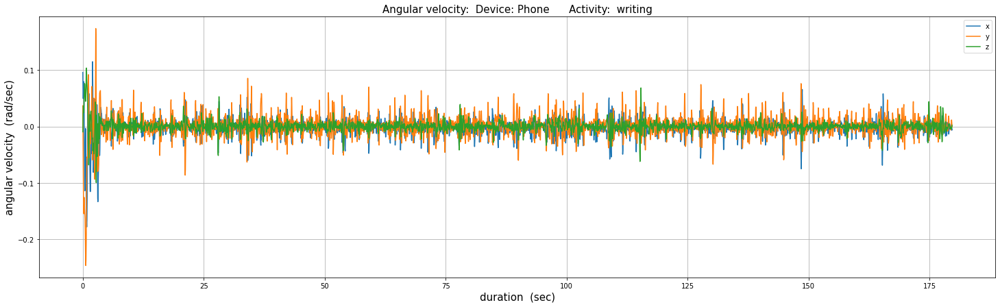

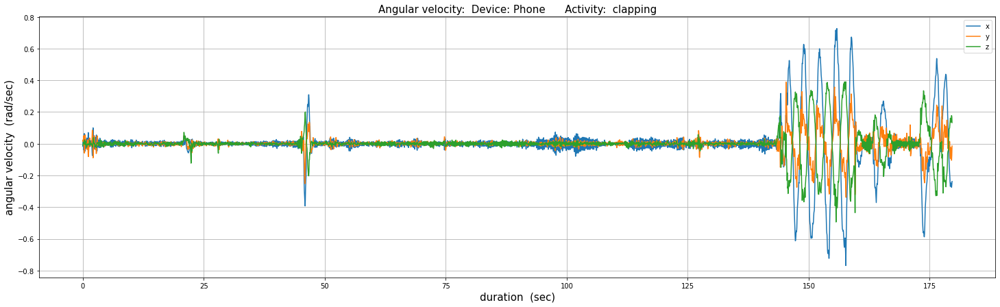

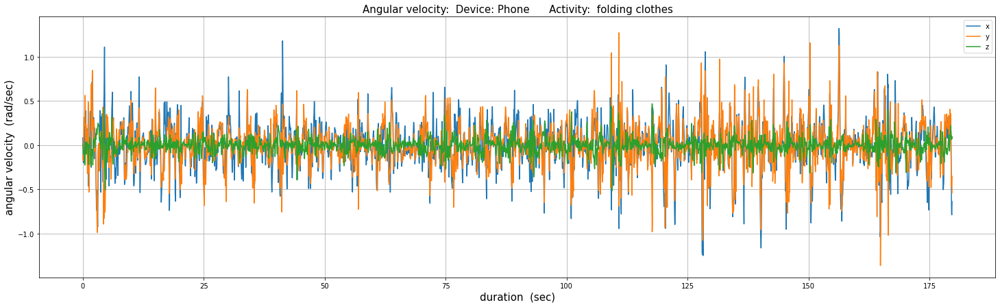

In [ ]:
for key in activity_codes_mapping:
  show_ang_velocity_per_activity('Phone', raw_par_35_phone_ang_vel, activity_codes_mapping[key])

In [ ]:

raw_par_45_watch_ang_vel = pd.read_csv('/content/drive/MyDrive/IACSD/wisdm-dataset/raw/watch/gyro/data_1635_gyro_watch.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_45_watch_ang_vel.z = raw_par_45_watch_ang_vel.z.str.strip(';')
raw_par_45_watch_ang_vel.z = pd.to_numeric(raw_par_45_watch_ang_vel.z)

raw_par_45_watch_ang_vel['activity'] = raw_par_45_watch_ang_vel['activity_code'].map(activity_codes_mapping)

raw_par_45_watch_ang_vel = raw_par_45_watch_ang_vel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_45_watch_ang_vel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1635,A,walking,64768437041043,0.117911,-0.145542,-1.300821
1,1635,A,walking,64768486541043,1.038300,-0.455534,-1.134640
2,1635,A,walking,64768536041043,0.876380,-0.541820,-0.844888
3,1635,A,walking,64768585541043,0.912599,-0.388422,-0.394281
4,1635,A,walking,64768635041043,0.048669,-0.046472,0.288554
...,...,...,...,...,...,...,...
64853,1635,S,folding clothes,68881084984774,-0.426159,0.298781,2.808190
64854,1635,S,folding clothes,68881134912344,1.008752,-0.439448,2.320299
64855,1635,S,folding clothes,68881184839914,0.938445,-0.437317,1.726947
64856,1635,S,folding clothes,68881234767484,1.552037,-0.296702,1.282731


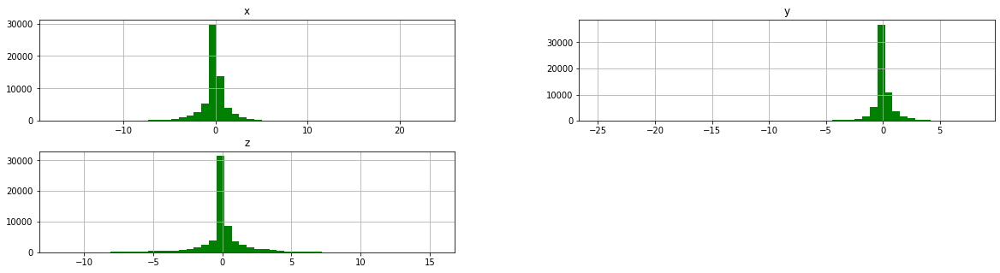

In [ ]:
T = raw_par_45_watch_ang_vel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

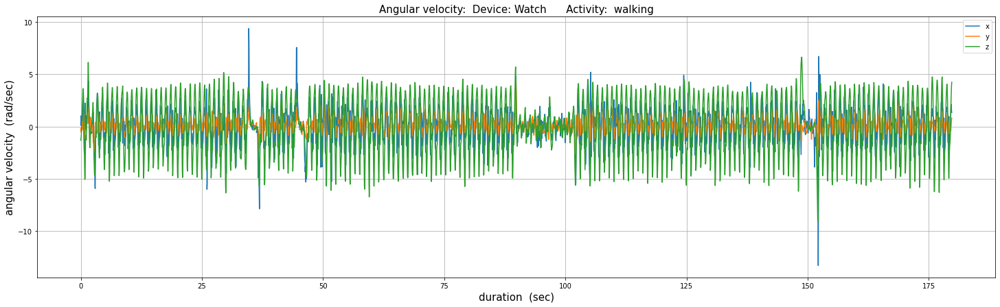

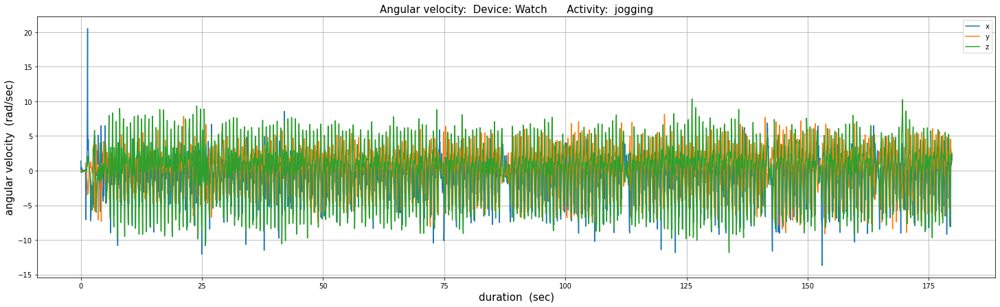

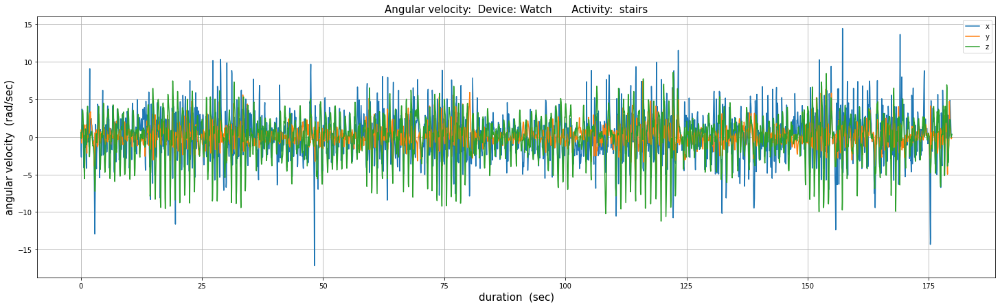

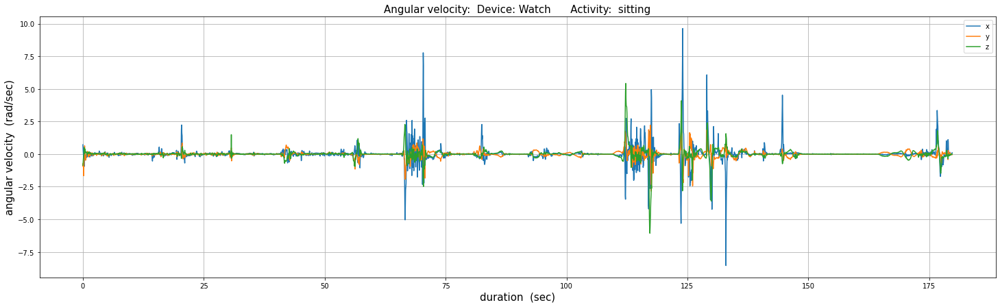

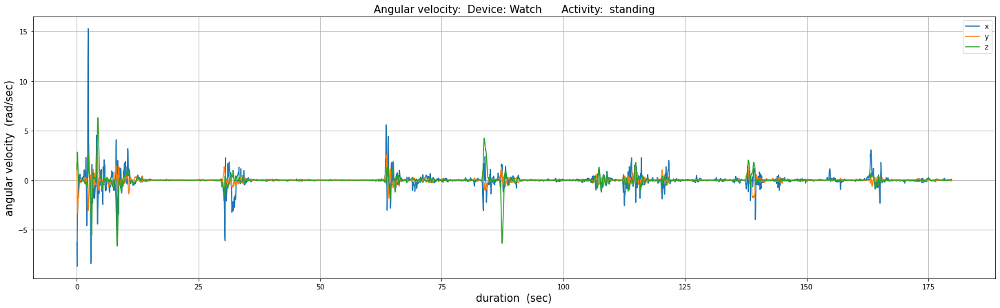

...

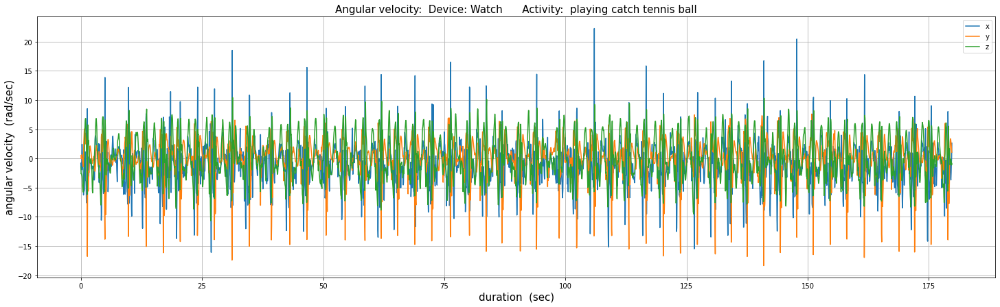

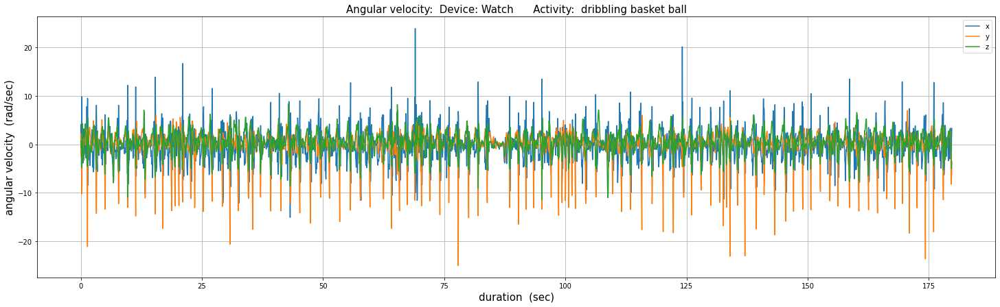

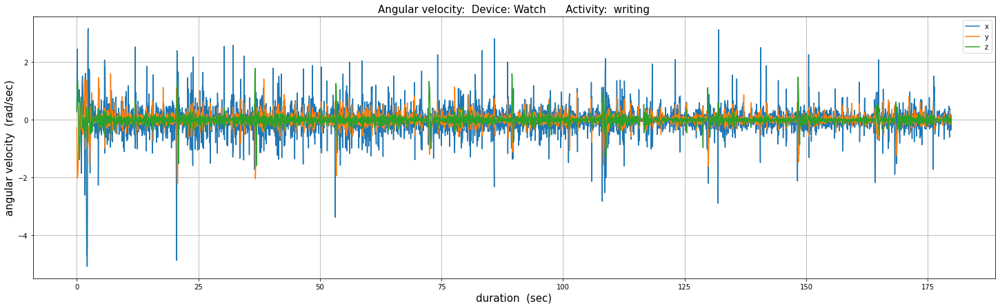

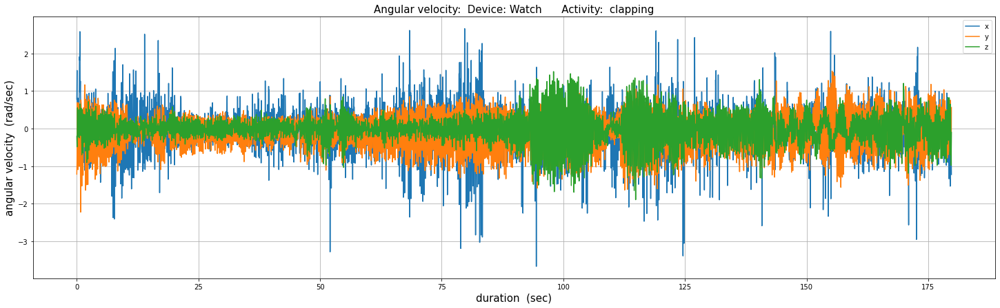

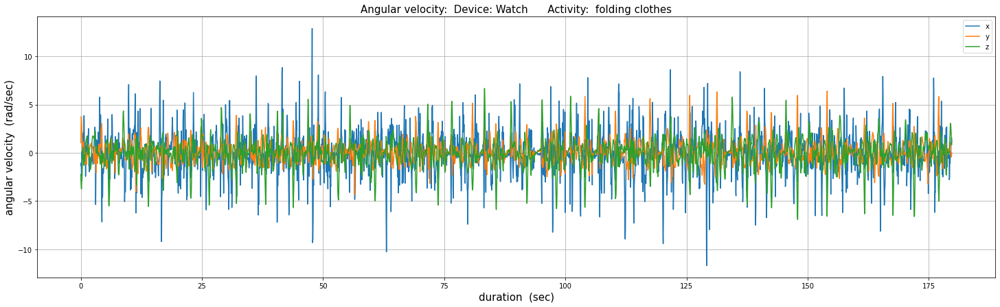

In [ ]:
for key in activity_codes_mapping:
  show_ang_velocity_per_activity('Watch', raw_par_45_watch_ang_vel, activity_codes_mapping[key])

In [ ]:
features = ['ACTIVITY',
            'X0', # 1st bin fraction of x axis acceleration distribution
            'X1', # 2nd bin fraction ...
            'X2',
            'X3',
            'X4',
            'X5',
            'X6',
            'X7',
            'X8',
            'X9',
            'Y0', # 1st bin fraction of y axis acceleration distribution
            'Y1', # 2nd bin fraction ...
            'Y2',
            'Y3',
            'Y4',
            'Y5',
            'Y6',
            'Y7',
            'Y8',
            'Y9',
            'Z0', # 1st bin fraction of z axis acceleration distribution
            'Z1', # 2nd bin fraction ...
            'Z2',
            'Z3',
            'Z4',
            'Z5',
            'Z6',
            'Z7',
            'Z8',
            'Z9',
            'XAVG', # average sensor value over the window (per axis)
            'YAVG',
            'ZAVG',
            'XPEAK', # Time in milliseconds between the peaks in the wave associated with most activities. heuristically determined (per axis)
            'YPEAK',
            'ZPEAK',
            'XABSOLDEV', # Average absolute difference between the each of the 200 readings and the mean of those values (per axis)
            'YABSOLDEV',
            'ZABSOLDEV',
            'XSTANDDEV', # Standard deviation of the 200 window's values (per axis)  ***BUG!***
            'YSTANDDEV',
            'ZSTANDDEV',
            'XVAR', # Variance of the 200 window's values (per axis)   ***BUG!***
            'YVAR',
            'ZVAR',
            'XMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'XMFCC1',
            'XMFCC2',
            'XMFCC3',
            'XMFCC4',
            'XMFCC5',
            'XMFCC6',
            'XMFCC7',
            'XMFCC8',
            'XMFCC9',
            'XMFCC10',
            'XMFCC11',
            'XMFCC12',
            'YMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'YMFCC1',
            'YMFCC2',
            'YMFCC3',
            'YMFCC4',
            'YMFCC5',
            'YMFCC6',
            'YMFCC7',
            'YMFCC8',
            'YMFCC9',
            'YMFCC10',
            'YMFCC11',
            'YMFCC12',
            'ZMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'ZMFCC1',
            'ZMFCC2',
            'ZMFCC3',
            'ZMFCC4',
            'ZMFCC5',
            'ZMFCC6',
            'ZMFCC7',
            'ZMFCC8',
            'ZMFCC9',
            'ZMFCC10',
            'ZMFCC11',
            'ZMFCC12',
            'XYCOS', # The cosine distances between sensor values for pairs of axes (three pairs of axes)
            'XZCOS',
            'YZCOS',
            'XYCOR', # The correlation between sensor values for pairs of axes (three pairs of axes)
            'XZCOR',
            'YZCOR',
            'RESULTANT', # Average resultant value, computed by squaring each matching x, y, and z value, summing them, taking the square root, and then averaging these values over the 200 readings
            'PARTICIPANT'] # Categirical: 1600 -1650

len(features)

93

In [ ]:
import glob

#the duplicate files to be ignored; all identical to 1600
duplicate_files = [str(i) for i in range(1611, 1618)] # '1611',...'1617'

path ='/content/drive/MyDrive/IACSD/wisdm-dataset/arff_files/phone/accel'
all_files = glob.glob(path + "/*.arff")

list_dfs_phone_accel = []

for filename in all_files:

    if any(dup_fn in filename for dup_fn in duplicate_files):
        continue #ignore the duplicate files
    df = pd.read_csv(filename, names = features, skiprows = 96, index_col=None, header=0)
    list_dfs_phone_accel.append(df)

all_phone_accel = pd.concat(list_dfs_phone_accel, axis=0, ignore_index=True, sort=False)

all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,...,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT,PARTICIPANT
0,A,0.235,0.470,0.275,0.020,0.000,0.0,0.0,0.0,0.0,...,0.486106,0.479859,-0.550668,0.049864,0.121354,-0.251024,0.164468,-0.110722,10.05180,1600
1,A,0.275,0.440,0.270,0.015,0.000,0.0,0.0,0.0,0.0,...,0.479571,0.473409,-0.633171,0.072129,0.161492,-0.386416,0.215680,-0.034375,10.11710,1600
2,A,0.320,0.430,0.245,0.000,0.005,0.0,0.0,0.0,0.0,...,0.483005,0.476798,-0.659493,0.087043,0.162157,-0.325151,0.272380,-0.077274,9.98384,1600
3,A,0.315,0.495,0.185,0.005,0.000,0.0,0.0,0.0,0.0,...,0.480711,0.474534,-0.712081,0.003810,0.210015,-0.364285,0.203131,0.015328,10.10600,1600
4,A,0.215,0.455,0.325,0.005,0.000,0.0,0.0,0.0,0.0,...,0.468836,0.462811,-0.534933,0.047553,0.275833,-0.216423,0.238500,-0.009870,10.05210,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,1.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.363594,0.358922,-0.999269,-0.998209,0.999411,0.528862,0.990504,0.469681,9.76138,1648
20646,S,1.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.361803,0.357154,-0.999951,-0.999949,0.999958,0.302419,0.913549,0.148172,9.77355,1648
20647,S,1.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.354794,0.350235,-0.999916,-0.999731,0.999888,0.334973,0.982666,0.324355,9.74347,1648
20648,S,1.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.353897,0.349349,-0.999971,-0.999943,0.999956,0.065045,0.924357,0.074776,9.75155,1648


In [ ]:
all_phone_accel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20650 entries, 0 to 20649
Data columns (total 93 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ACTIVITY     20650 non-null  object 
 1   X0           20650 non-null  float64
 2   X1           20650 non-null  float64
 3   X2           20650 non-null  float64
 4   X3           20650 non-null  float64
 5   X4           20650 non-null  float64
 6   X5           20650 non-null  float64
 7   X6           20650 non-null  float64
 8   X7           20650 non-null  float64
 9   X8           20650 non-null  float64
 10  X9           20650 non-null  float64
 11  Y0           20650 non-null  float64
 12  Y1           20650 non-null  float64
 13  Y2           20650 non-null  float64
 14  Y3           20650 non-null  float64
 15  Y4           20650 non-null  float64
 16  Y5           20650 non-null  float64
 17  Y6           20650 non-null  float64
 18  Y7           20650 non-null  float64
 19  Y8  

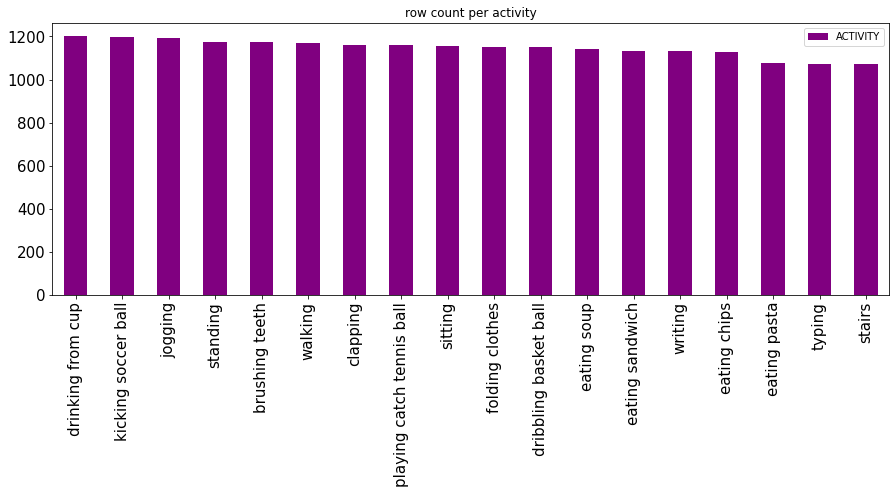

In [ ]:
_ = all_phone_accel['ACTIVITY'].map(activity_codes_mapping).value_counts().plot(kind = 'bar', figsize = (15,5), color = 'purple', title = 'row count per activity', legend = True, fontsize = 15)

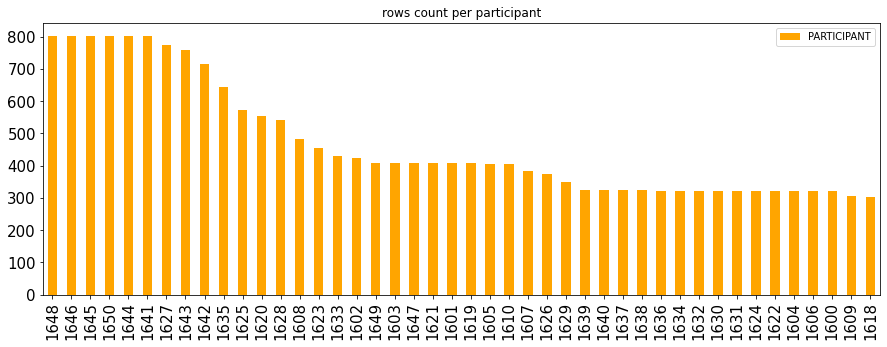

In [ ]:
_ = all_phone_accel['PARTICIPANT'].value_counts().plot(kind = 'bar', figsize = (15,5), color = 'orange', title= 'rows count per participant', legend = True, fontsize = 15)

The following columns:'XSTANDDEV', 'YSTANDDEV', 'ZSTANDDEV' ,'XVAR', 'YVAR', 'ZVAR' are suspected to contain erroneous data: ( e.g. absolute deviation is not of the same order of magnitude of standard deviation; variance is not the square of standard deviation !!!)

In [ ]:
all_phone_accel[['XABSOLDEV', 'YABSOLDEV','ZABSOLDEV','XSTANDDEV', 'YSTANDDEV', 'ZSTANDDEV', 'XVAR', 'YVAR', 'ZVAR']].head()

,XABSOLDEV,YABSOLDEV,ZABSOLDEV,XSTANDDEV,YSTANDDEV,ZSTANDDEV,XVAR,YVAR,ZVAR
0,1.59095,3.29508,1.60941,0.141170,0.283329,0.159800,0.375726,0.532286,0.399750
1,1.77817,3.33490,1.68296,0.161229,0.287955,0.157993,0.401533,0.536614,0.397483
2,1.70505,3.14244,1.69288,0.156200,0.269307,0.159797,0.395221,0.518948,0.399746
3,1.62315,3.32790,1.57944,0.141721,0.283364,0.154396,0.376459,0.532320,0.392933
4,1.48888,3.01196,1.45931,0.131537,0.256423,0.140283,0.362681,0.506383,0.374544


In [ ]:
all_phone_accel.drop(['XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1, inplace = True)

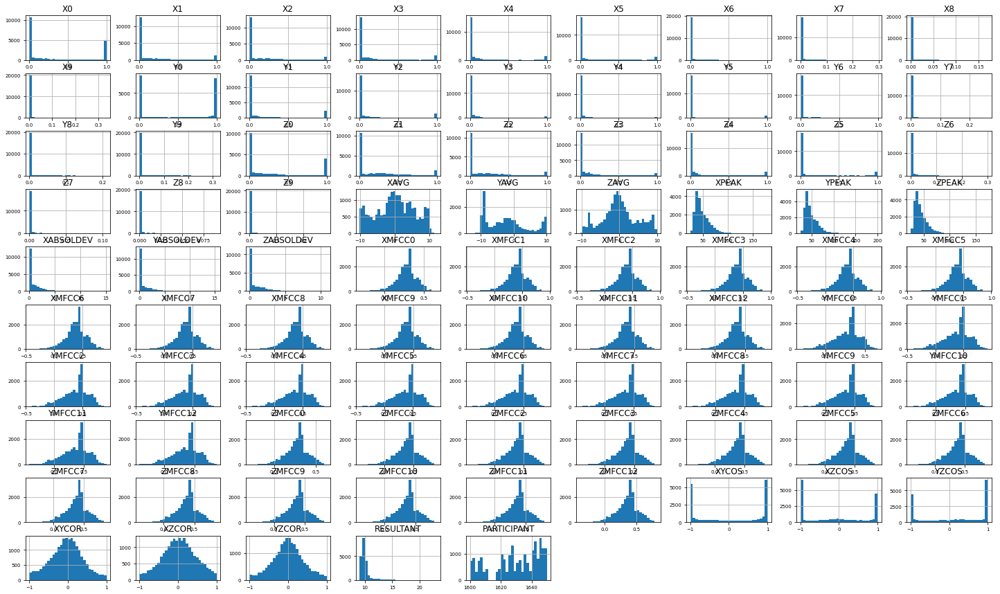

In [ ]:
ax = all_phone_accel.hist(bins=30, figsize=(25, 15), xlabelsize = 7, ylabelsize = 7)

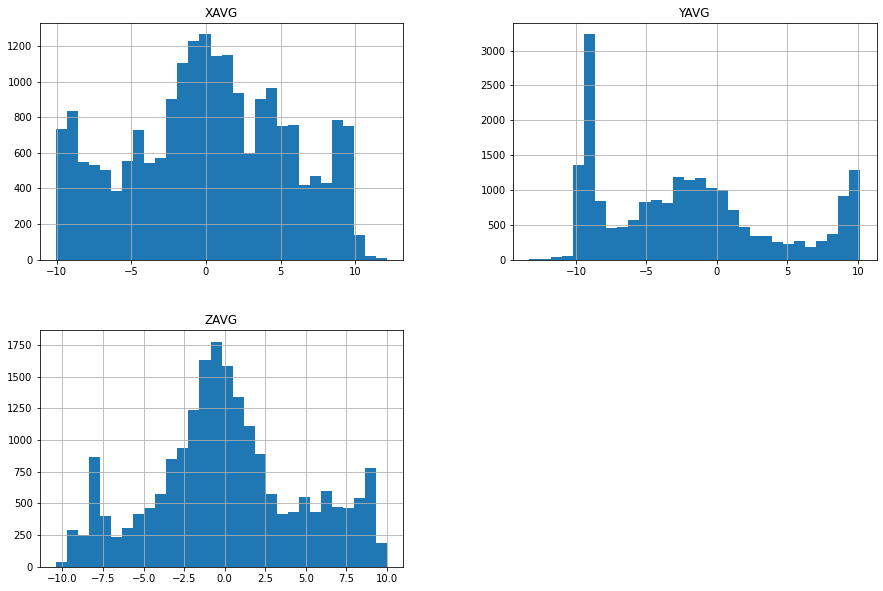

In [ ]:
_ = all_phone_accel[['XAVG', 'YAVG', 'ZAVG']].hist(bins=30, figsize=(15, 10))

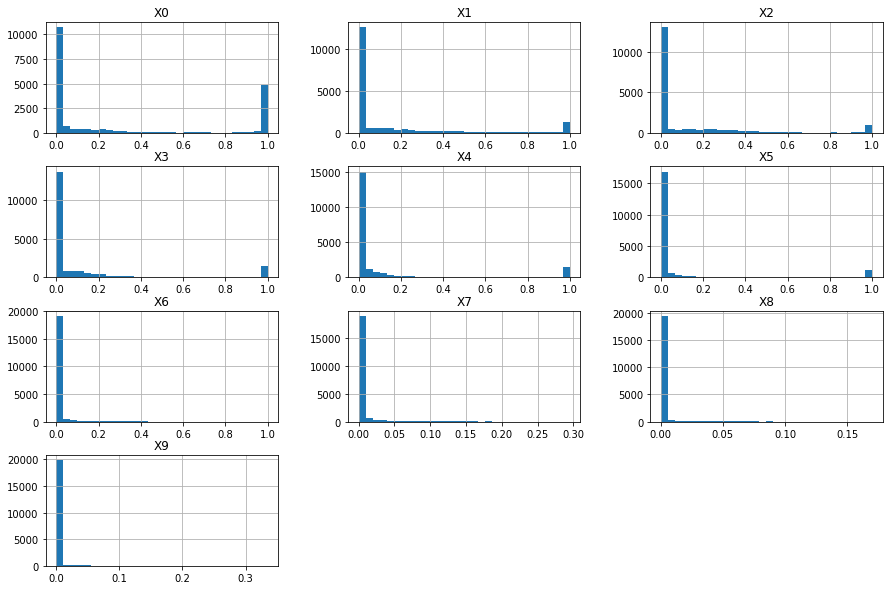

In [ ]:
_ = all_phone_accel[['X0', 'X1', 'X2', 'X3','X4','X5','X6','X7','X8','X9']].hist(bins=30, figsize=(15, 10))

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


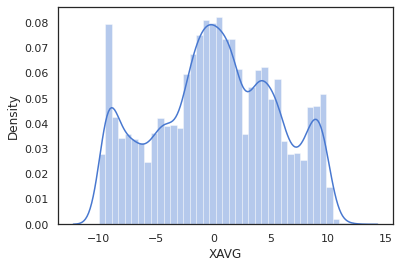

In [ ]:
import seaborn as sns

sns.set(color_codes=True)
sns.set(style="white", palette="muted")
_ = sns.distplot(all_phone_accel['XAVG'])

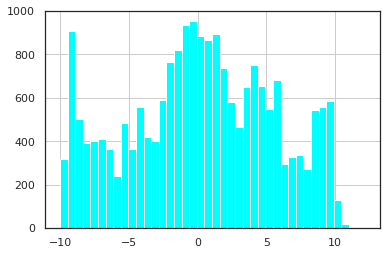

In [ ]:
_ = all_phone_accel['XAVG'].hist(bins=40, color = 'cyan')

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


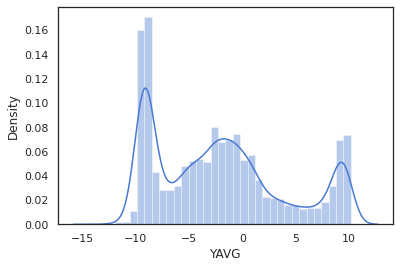

In [ ]:
_ = sns.distplot(all_phone_accel['YAVG'])

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


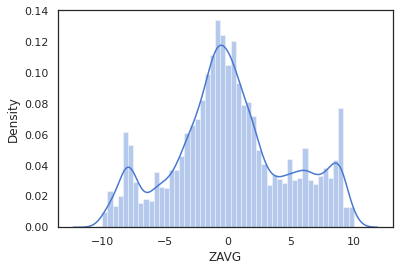

In [ ]:
_ = sns.distplot(all_phone_accel['ZAVG'])

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


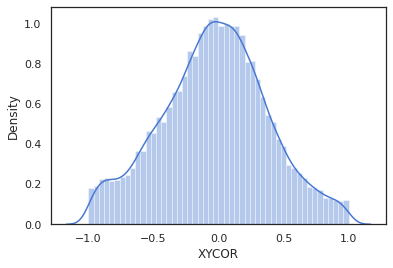

In [ ]:
_ = sns.distplot(all_phone_accel['XYCOR'])

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


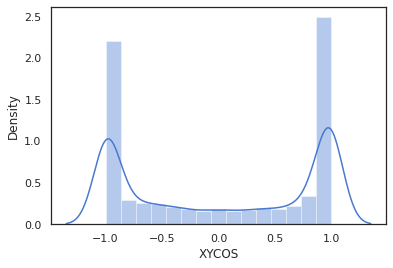

In [ ]:
_ = sns.distplot(all_phone_accel['XYCOS'])

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


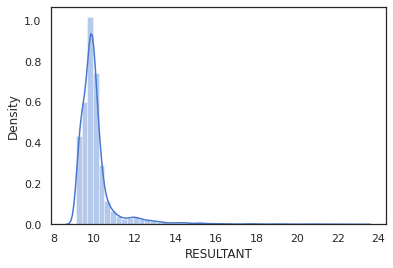

In [ ]:
_ = sns.distplot(all_phone_accel['RESULTANT'])

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


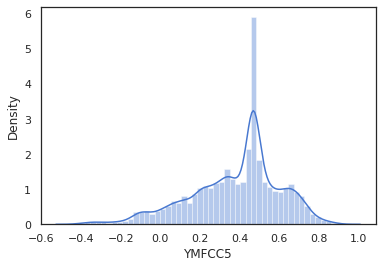

In [ ]:
_ = sns.distplot(all_phone_accel['YMFCC5'])

# Preprocessing

In [ ]:
all_phone_accel.drop('PARTICIPANT', axis = 1, inplace = True)

In [ ]:
from sklearn.model_selection import train_test_split

y = all_phone_accel.ACTIVITY
X = all_phone_accel.drop('ACTIVITY', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size = 0.75, 
                                                    test_size = 0.25,
                                                    shuffle = True, 
                                                    stratify = all_phone_accel.ACTIVITY)

In [ ]:
X_train

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
7075,0.000,1.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.441078,0.435943,0.430341,0.997831,-0.999763,-0.997999,0.022168,0.096550,0.114892,9.21161
18737,0.000,0.000,0.000,0.000,1.000,0.000,0.00,0.0,0.0,0.0,...,0.410030,0.405256,0.400049,-0.999967,-0.999982,0.999958,-0.326594,0.240381,-0.087365,9.84452
19537,0.030,0.385,0.395,0.135,0.050,0.005,0.00,0.0,0.0,0.0,...,0.477794,0.472231,0.466163,0.433781,0.018864,0.637668,0.464207,-0.308557,-0.175750,10.76350
10240,0.095,0.000,0.000,0.000,0.005,0.890,0.01,0.0,0.0,0.0,...,0.252758,0.249815,0.246605,0.653647,0.929762,0.768128,-0.325059,0.800405,-0.271180,9.48384
3720,0.000,0.000,0.000,1.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.154763,0.152962,0.150996,0.999684,0.992690,0.992011,-0.070734,-0.121099,-0.835756,9.52910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2085,0.000,1.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.441233,0.436096,0.430493,0.996453,-0.997198,-0.997663,0.257555,0.351786,0.465053,9.21070
2591,0.225,0.470,0.235,0.015,0.035,0.020,0.00,0.0,0.0,0.0,...,0.576490,0.569779,0.562457,-0.282693,0.428318,0.178835,-0.021846,0.511444,0.042879,10.60290
3039,0.230,0.585,0.165,0.020,0.000,0.000,0.00,0.0,0.0,0.0,...,0.422015,0.417102,0.411743,0.607239,-0.483203,-0.433651,0.073374,-0.269639,0.172333,9.91910
10807,0.990,0.010,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.391398,0.386841,0.381870,0.912461,0.705014,0.775838,-0.492315,-0.163975,0.244028,10.22550


In [ ]:
y_train

7075     G
18737    J
19537    L
10240    Q
3720     K
        ..
2085     J
2591     A
3039     C
10807    O
8182     M
Name: ACTIVITY, Length: 15487, dtype: object

In [ ]:
X_test

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
6085,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.317627,0.313929,0.309895,0.998361,-0.997009,-0.996106,-0.100004,0.475333,0.581663,9.59106
19021,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.415619,0.410781,0.405502,-0.999917,-0.999979,0.999960,0.516066,-0.451570,-0.424170,9.67577
15421,0.165,0.300,0.340,0.080,0.050,0.015,0.005,0.02,0.005,0.02,...,0.655233,0.647604,0.639283,-0.197846,-0.279152,0.510129,-0.338254,-0.276000,0.332571,11.54290
10896,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.272664,0.269490,0.266027,0.999866,-0.999857,-0.999784,-0.063292,0.671882,0.077273,9.69150
7677,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.00,0.000,0.00,...,0.350054,0.345979,0.341533,-0.999960,-0.999961,0.999970,0.439955,0.279559,0.103789,9.88521
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3784,0.015,0.035,0.175,0.705,0.055,0.005,0.010,0.00,0.000,0.00,...,0.442244,0.437095,0.431478,-0.853553,0.525955,-0.681591,0.224730,-0.192189,-0.080401,9.73955
15992,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.00,0.000,0.00,...,0.188238,0.186047,0.183656,-0.992771,0.999020,-0.990647,0.988788,0.552050,0.611738,9.81609
17786,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.287770,0.284420,0.280765,-0.901783,0.961623,-0.912654,0.150125,-0.661714,-0.329434,9.49740
1246,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.113131,0.111814,0.110377,-0.963141,0.963974,-0.975499,0.588054,-0.726841,-0.645104,10.02270


In [ ]:
y_test

6085     R
19021    Q
15421    M
10896    Q
7677     F
        ..
3784     M
15992    J
17786    O
1246     H
10790    M
Name: ACTIVITY, Length: 5163, dtype: object

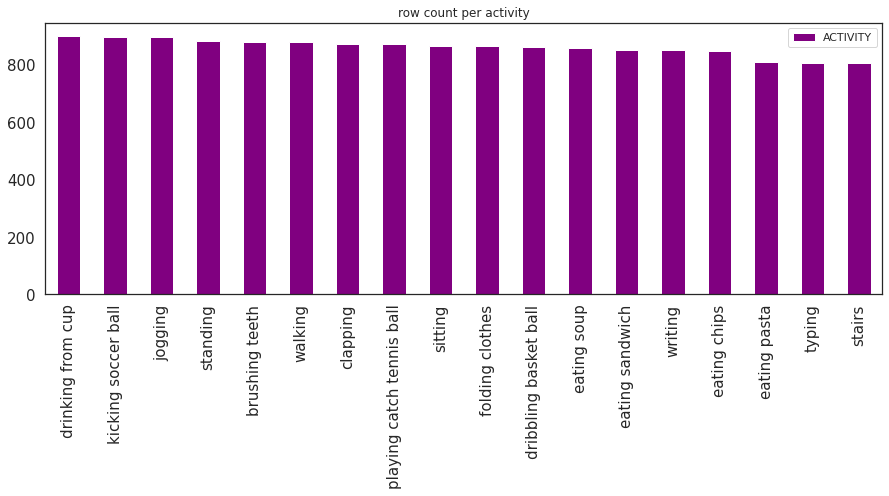

In [ ]:
_ = y_train.map(activity_codes_mapping).value_counts().plot(kind = 'bar', figsize = (15,5), color = 'purple', title = 'row count per activity', legend = True, fontsize = 15)

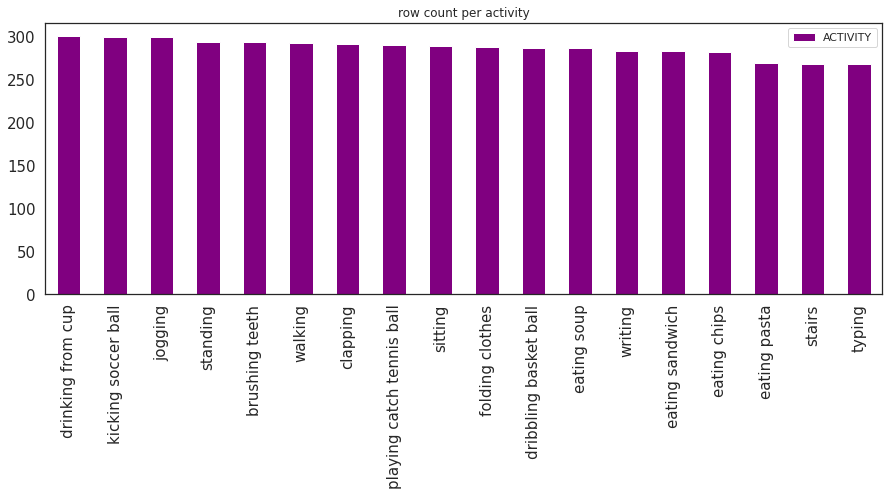

In [ ]:
_ = y_test.map(activity_codes_mapping).value_counts().plot(kind = 'bar', figsize = (15,5), color = 'purple', title = 'row count per activity', legend = True, fontsize = 15)

In [ ]:
X_train.insert(0, 'Y', y_train)

In [ ]:
X_train

,Y,X0,X1,X2,X3,X4,X5,X6,X7,X8,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
7075,G,0.000,1.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,...,0.441078,0.435943,0.430341,0.997831,-0.999763,-0.997999,0.022168,0.096550,0.114892,9.21161
18737,J,0.000,0.000,0.000,0.000,1.000,0.000,0.00,0.0,0.0,...,0.410030,0.405256,0.400049,-0.999967,-0.999982,0.999958,-0.326594,0.240381,-0.087365,9.84452
19537,L,0.030,0.385,0.395,0.135,0.050,0.005,0.00,0.0,0.0,...,0.477794,0.472231,0.466163,0.433781,0.018864,0.637668,0.464207,-0.308557,-0.175750,10.76350
10240,Q,0.095,0.000,0.000,0.000,0.005,0.890,0.01,0.0,0.0,...,0.252758,0.249815,0.246605,0.653647,0.929762,0.768128,-0.325059,0.800405,-0.271180,9.48384
3720,K,0.000,0.000,0.000,1.000,0.000,0.000,0.00,0.0,0.0,...,0.154763,0.152962,0.150996,0.999684,0.992690,0.992011,-0.070734,-0.121099,-0.835756,9.52910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2085,J,0.000,1.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,...,0.441233,0.436096,0.430493,0.996453,-0.997198,-0.997663,0.257555,0.351786,0.465053,9.21070
2591,A,0.225,0.470,0.235,0.015,0.035,0.020,0.00,0.0,0.0,...,0.576490,0.569779,0.562457,-0.282693,0.428318,0.178835,-0.021846,0.511444,0.042879,10.60290
3039,C,0.230,0.585,0.165,0.020,0.000,0.000,0.00,0.0,0.0,...,0.422015,0.417102,0.411743,0.607239,-0.483203,-0.433651,0.073374,-0.269639,0.172333,9.91910
10807,O,0.990,0.010,0.000,0.000,0.000,0.000,0.00,0.0,0.0,...,0.391398,0.386841,0.381870,0.912461,0.705014,0.775838,-0.492315,-0.163975,0.244028,10.22550


In [ ]:
upper_threshold_XPEAK = X_train.XPEAK.mean() + 9*X_train.XPEAK.std()
upper_threshold_XPEAK

176.66248893095815

In [ ]:
X_train.XPEAK.max()

153.333

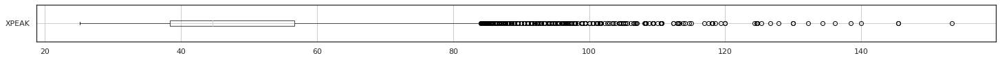

In [ ]:
_ = X_train.boxplot(column=['XPEAK'], figsize=[25,1], vert=False)

In [ ]:
X_train = X_train[X_train.XPEAK < upper_threshold_XPEAK].copy()

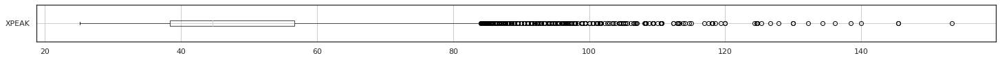

In [ ]:
_ = X_train.boxplot(column=['XPEAK'], figsize=[25,1], vert=False)

In [ ]:
upper_threshold_YPEAK = X_train.YPEAK.mean() + 9*X_train.YPEAK.std()
upper_threshold_YPEAK

186.3810421688946

In [ ]:
X_train.YPEAK.max()

200.0

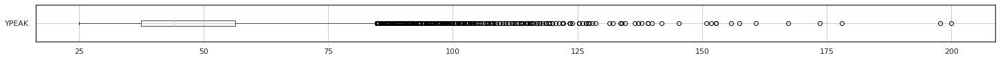

In [ ]:
_ = X_train.boxplot(column=['YPEAK'], figsize=[25,1], vert=False)

In [ ]:
X_train = X_train[X_train.YPEAK < upper_threshold_YPEAK].copy()


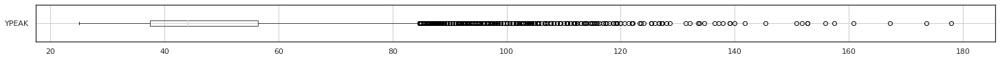

In [ ]:
_ = X_train.boxplot(column=['YPEAK'], figsize=[25,1], vert=False)

In [ ]:
upper_threshold_ZPEAK = X_train.ZPEAK.mean() + 9*X_train.ZPEAK.std()
upper_threshold_ZPEAK

151.6000292609157

In [ ]:
X_train.ZPEAK.max()

173.0

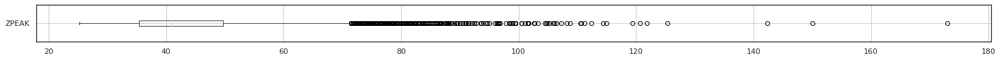

In [ ]:
_ = X_train.boxplot(column=['ZPEAK'], figsize=[25,1], vert=False)

In [ ]:
X_train = X_train[X_train.ZPEAK < upper_threshold_ZPEAK].copy()

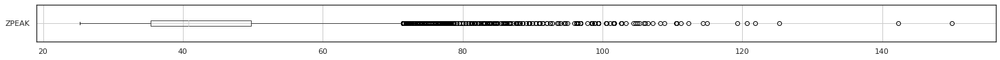

In [ ]:
_ = X_train.boxplot(column=['ZPEAK'], figsize=[25,1], vert=False)

In [ ]:
y_train = X_train['Y']

In [ ]:
y_train

7075     G
18737    J
19537    L
10240    Q
3720     K
        ..
2085     J
2591     A
3039     C
10807    O
8182     M
Name: Y, Length: 15484, dtype: object

In [ ]:
X_train.drop(['Y'], axis = 1, inplace = True)

In [ ]:
from sklearn.preprocessing import MaxAbsScaler

scaling_transformer = MaxAbsScaler().fit(X_train[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']])

In [ ]:
X_train[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']] = scaling_transformer.transform(X_train[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']])

In [ ]:
X_test = X_test.copy()

In [ ]:
X_test[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']] = scaling_transformer.transform(X_test[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']])

In [ ]:
X_test

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
6085,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.317627,0.313929,0.309895,0.998361,-0.997009,-0.996106,-0.100004,0.475333,0.581663,0.414213
19021,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.415619,0.410781,0.405502,-0.999917,-0.999979,0.999960,0.516066,-0.451570,-0.424170,0.417871
15421,0.165,0.300,0.340,0.080,0.050,0.015,0.005,0.02,0.005,0.02,...,0.655233,0.647604,0.639283,-0.197846,-0.279152,0.510129,-0.338254,-0.276000,0.332571,0.498508
10896,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.272664,0.269490,0.266027,0.999866,-0.999857,-0.999784,-0.063292,0.671882,0.077273,0.418551
7677,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.00,0.000,0.00,...,0.350054,0.345979,0.341533,-0.999960,-0.999961,0.999970,0.439955,0.279559,0.103789,0.426917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3784,0.015,0.035,0.175,0.705,0.055,0.005,0.010,0.00,0.000,0.00,...,0.442244,0.437095,0.431478,-0.853553,0.525955,-0.681591,0.224730,-0.192189,-0.080401,0.420626
15992,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.00,0.000,0.00,...,0.188238,0.186047,0.183656,-0.992771,0.999020,-0.990647,0.988788,0.552050,0.611738,0.423931
17786,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.287770,0.284420,0.280765,-0.901783,0.961623,-0.912654,0.150125,-0.661714,-0.329434,0.410168
1246,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.113131,0.111814,0.110377,-0.963141,0.963974,-0.975499,0.588054,-0.726841,-0.645104,0.432854


In [ ]:
X_train.reset_index(drop = True, inplace = True)
X_train

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,0.000,1.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.441078,0.435943,0.430341,0.997831,-0.999763,-0.997999,0.022168,0.096550,0.114892,0.397826
1,0.000,0.000,0.000,0.000,1.000,0.000,0.00,0.0,0.0,0.0,...,0.410030,0.405256,0.400049,-0.999967,-0.999982,0.999958,-0.326594,0.240381,-0.087365,0.425159
2,0.030,0.385,0.395,0.135,0.050,0.005,0.00,0.0,0.0,0.0,...,0.477794,0.472231,0.466163,0.433781,0.018864,0.637668,0.464207,-0.308557,-0.175750,0.464848
3,0.095,0.000,0.000,0.000,0.005,0.890,0.01,0.0,0.0,0.0,...,0.252758,0.249815,0.246605,0.653647,0.929762,0.768128,-0.325059,0.800405,-0.271180,0.409582
4,0.000,0.000,0.000,1.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.154763,0.152962,0.150996,0.999684,0.992690,0.992011,-0.070734,-0.121099,-0.835756,0.411537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15479,0.000,1.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.441233,0.436096,0.430493,0.996453,-0.997198,-0.997663,0.257555,0.351786,0.465053,0.397786
15480,0.225,0.470,0.235,0.015,0.035,0.020,0.00,0.0,0.0,0.0,...,0.576490,0.569779,0.562457,-0.282693,0.428318,0.178835,-0.021846,0.511444,0.042879,0.457912
15481,0.230,0.585,0.165,0.020,0.000,0.000,0.00,0.0,0.0,0.0,...,0.422015,0.417102,0.411743,0.607239,-0.483203,-0.433651,0.073374,-0.269639,0.172333,0.428380
15482,0.990,0.010,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,...,0.391398,0.386841,0.381870,0.912461,0.705014,0.775838,-0.492315,-0.163975,0.244028,0.441613


In [ ]:
X_test.reset_index(drop = True, inplace = True)
X_test

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.317627,0.313929,0.309895,0.998361,-0.997009,-0.996106,-0.100004,0.475333,0.581663,0.414213
1,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.415619,0.410781,0.405502,-0.999917,-0.999979,0.999960,0.516066,-0.451570,-0.424170,0.417871
2,0.165,0.300,0.340,0.080,0.050,0.015,0.005,0.02,0.005,0.02,...,0.655233,0.647604,0.639283,-0.197846,-0.279152,0.510129,-0.338254,-0.276000,0.332571,0.498508
3,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.272664,0.269490,0.266027,0.999866,-0.999857,-0.999784,-0.063292,0.671882,0.077273,0.418551
4,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.00,0.000,0.00,...,0.350054,0.345979,0.341533,-0.999960,-0.999961,0.999970,0.439955,0.279559,0.103789,0.426917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5158,0.015,0.035,0.175,0.705,0.055,0.005,0.010,0.00,0.000,0.00,...,0.442244,0.437095,0.431478,-0.853553,0.525955,-0.681591,0.224730,-0.192189,-0.080401,0.420626
5159,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.00,0.000,0.00,...,0.188238,0.186047,0.183656,-0.992771,0.999020,-0.990647,0.988788,0.552050,0.611738,0.423931
5160,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.287770,0.284420,0.280765,-0.901783,0.961623,-0.912654,0.150125,-0.661714,-0.329434,0.410168
5161,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,...,0.113131,0.111814,0.110377,-0.963141,0.963974,-0.975499,0.588054,-0.726841,-0.645104,0.432854


In [ ]:
y_train.reset_index(drop = True, inplace = True)
y_train

0        G
1        J
2        L
3        Q
4        K
        ..
15479    J
15480    A
15481    C
15482    O
15483    M
Name: Y, Length: 15484, dtype: object

In [ ]:
y_test.reset_index(drop = True, inplace = True)
y_test

0       R
1       Q
2       M
3       Q
4       F
       ..
5158    M
5159    J
5160    O
5161    H
5162    M
Name: ACTIVITY, Length: 5163, dtype: object

In [ ]:
fn = '/content/drive/MyDrive/IACSD/wisdm-dataset/arff_files/phone/accel/data_1623_accel_phone.arff'
par_23_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_23_df['ACT'] = par_23_df['ACTIVITY'].map(activity_codes_mapping)

In [ ]:
import plotly.express as px

fig = px.scatter_3d(par_23_df, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

In [ ]:
fn = '/content/drive/MyDrive/IACSD/wisdm-dataset/arff_files/phone/accel/data_1640_accel_phone.arff'
par_40_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_40_df['ACT'] = par_40_df['ACTIVITY'].map(activity_codes_mapping)

In [ ]:
import plotly.express as px

fig = px.scatter_3d(par_40_df, x='XABSOLDEV', y='YABSOLDEV', z='ZABSOLDEV', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

In [ ]:
fn = '/content/drive/MyDrive/IACSD/wisdm-dataset/arff_files/phone/accel/data_1635_accel_phone.arff'
par_35_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_35_df['ACT'] = par_35_df['ACTIVITY'].map(activity_codes_mapping)

In [ ]:
import plotly.express as px

fig = px.scatter_3d(par_35_df, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height = 1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

In [ ]:
fn = r'/content/drive/MyDrive/IACSD/wisdm-dataset/arff_files/phone/accel/data_1640_accel_phone.arff'
par_0_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_0_df['ACT'] = par_0_df['ACTIVITY'].map(activity_codes_mapping)

In [ ]:
import plotly.express as px

fig = px.scatter_3d(par_0_df, x='X5', y='Y5', z='Z5', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

In [ ]:

import plotly.express as px

fig = px.scatter_3d(par_0_df, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

In [ ]:

import plotly.express as px

all_pa = all_phone_accel.copy()
all_pa['ACT'] = all_pa['ACTIVITY'].map(activity_codes_mapping)

fig = px.scatter_3d(all_pa, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XABSOLDEV', y='YABSOLDEV', z='ZABSOLDEV', color ='ACT')
#fig = px.scatter_3d(all_pa, x='XYCOS', y='XZCOS', z='YZCOS', color ='ACTIVITY')
#fig = px.scatter_3d(all_pa, x='X9', y='Y9', z='Z9', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XYCOR', y='XZCOR', z='YZCOR', color ='ACTIVITY')

#fig = px.scatter_3d(all_pa, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACTIVITY')

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=1800,
                    height = 1000,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

In [ ]:
import plotly.express as px

fig = px.scatter_3d(all_pa, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=1800,
                    height = 1000,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.show()

In [ ]:

from matplotlib import pyplot as plt
from sklearn.manifold import TSNE

def plot_tSNE(X, y, fig_size):
    tsne = TSNE(n_components=2, random_state=300)
    X_2d = tsne.fit_transform(X)
    target_ids = ('A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'O', 'P', 'Q', 'R', 'S' )

    plt.figure(figsize=(fig_size, fig_size))
    colors = 'lime', 'red', 'blue', 'orange', 'yellow', 'lightgreen', 'greenyellow', 'magenta', 'gold', 'cyan', 'purple', 'lightgreen', 'violet', 'limegreen', 'deepskyblue', 'mediumspringgreen', 'plum', 'olive'

    for i, c, label in zip(target_ids, colors, tuple(activity_codes_mapping.values())):
        plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c=c, label=label)

    plt.legend()
    plt.show()

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



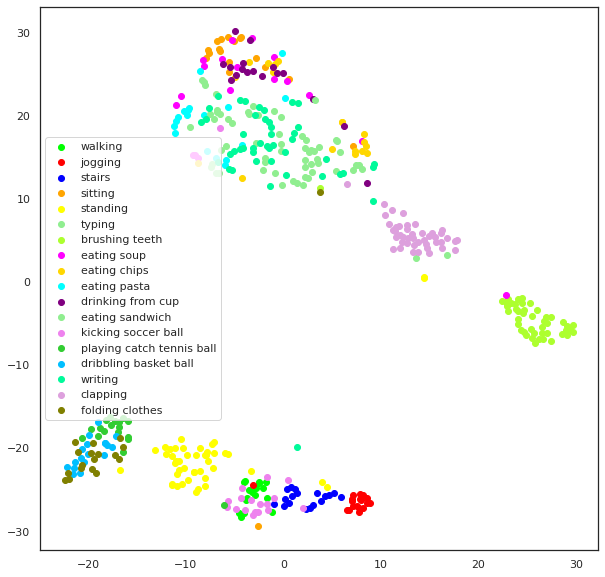

In [ ]:
yy = par_23_df.ACTIVITY
XX = par_23_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



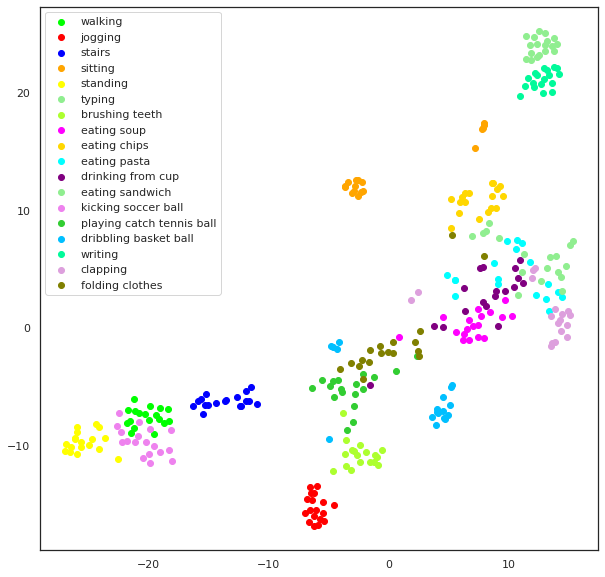

In [ ]:
yy = par_40_df.ACTIVITY
XX = par_40_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



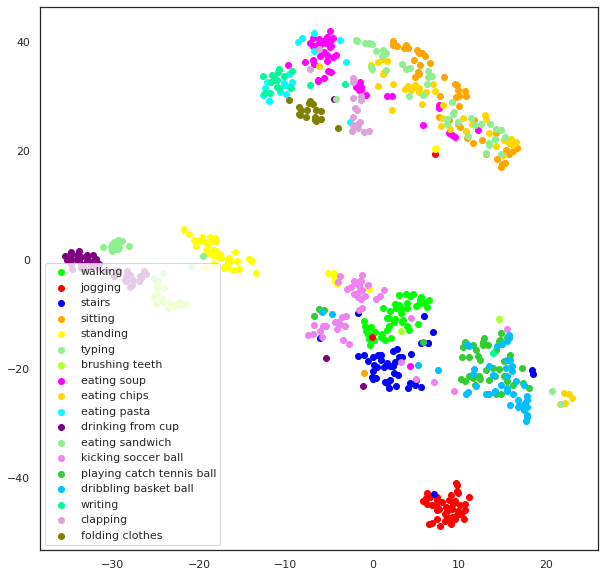

In [ ]:
yy = par_35_df.ACTIVITY
XX = par_35_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



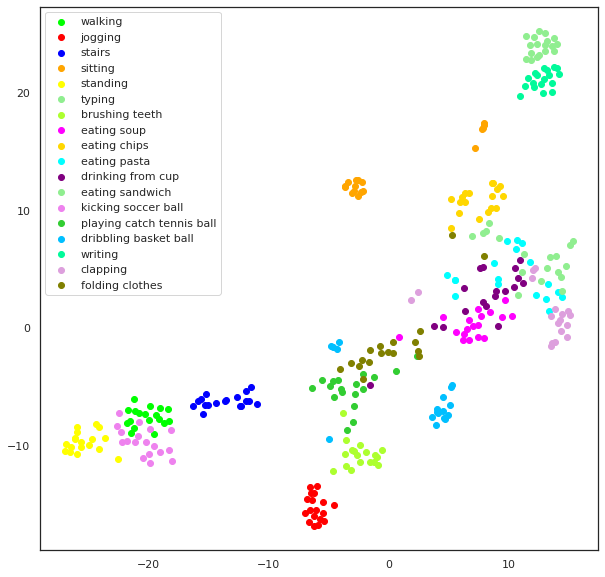

In [ ]:
yy = par_0_df.ACTIVITY
XX = par_0_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

# Application of Machine Learning Classification Models:

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time

# For the tree models
from sklearn.metrics import log_loss
from sklearn.tree import DecisionTreeClassifier, export_graphviz

from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
import warnings


#!pip install pydot

# For the tree visualization

from IPython.display import Image
# from sklearn.externals.six import StringIO
from io import StringIO
from sklearn.tree import export_graphviz
import pydot

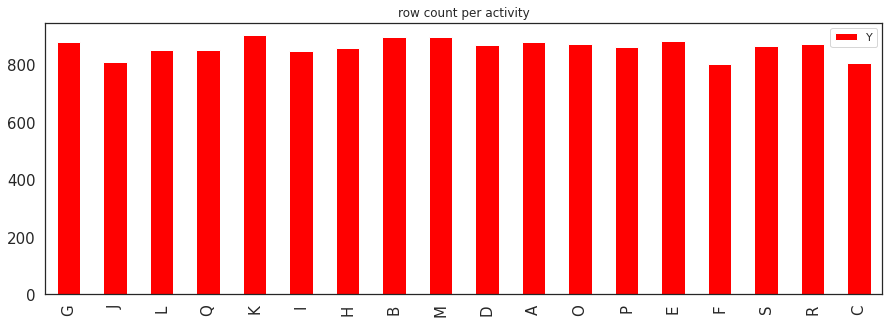

In [ ]:
_ = y_train.value_counts(sort = False).plot(kind = 'bar', figsize = (15,5), color = 'red', title = 'row count per activity', legend = True, fontsize = 15)


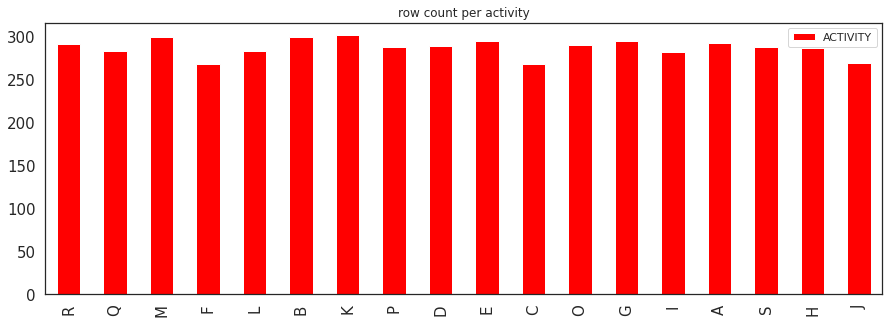

In [ ]:
_ = y_test.value_counts(sort = False).plot(kind = 'bar', figsize = (15,5), color = 'red', title = 'row count per activity', legend = True, fontsize = 15)


In [ ]:
def visualize_tree(model, md=5, width=800):
    dot_data = StringIO()  
    export_graphviz(model, out_file=dot_data, feature_names=X_train.columns, max_depth=md)
    graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]  
    return Image(graph.create_png(), width=width) 

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GroupKFold

my_cv = StratifiedShuffleSplit(n_splits=5, train_size=0.7, test_size=0.3)

In [ ]:
dt_classifier = DecisionTreeClassifier()

In [ ]:
my_param_grid = {'min_samples_leaf': [6, 10, 20, 40],
                 'min_weight_fraction_leaf': [0.01, 0.02, 0.05],
                 'criterion': ['entropy'],
                 'min_impurity_decrease': [1e-2, 7e-3]}

In [ ]:
dt_model_gs = GridSearchCV(estimator=dt_classifier, 
                           param_grid=my_param_grid, 
                           cv=my_cv, 
                           scoring='accuracy',
                           verbose = 0,
                           return_train_score = True)

In [ ]:
dt_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy'],
                         'min_impurity_decrease': [0.01, 0.007],
                         'min_samples_leaf': [6, 10, 20, 40],
                         'min_weight_fraction_leaf': [0.01, 0.02, 0.05]},
             return_train_score=True, scoring='accuracy')

In [ ]:
dt_model_gs.best_params_

{'criterion': 'entropy',
 'min_impurity_decrease': 0.007,
 'min_samples_leaf': 6,
 'min_weight_fraction_leaf': 0.01}

In [ ]:
dt_best_classifier = dt_model_gs.best_estimator_

In [ ]:
dt_model_gs.cv_results_

{'mean_fit_time': array([1.76451197, 1.9290298 , 1.52252374, 1.64002094, 1.1911231 ,
        1.03795128, 1.43740239, 2.03844681, 1.14343243, 1.50111823,
        1.40224853, 0.82028351, 1.65918221, 1.22889686, 0.82008038,
        1.68064299, 1.34701405, 0.88058844, 1.57495661, 1.30931354,
        0.81546025, 1.67754617, 1.26721792, 1.07357569]),
 'std_fit_time': array([0.52198942, 0.95761184, 0.1443502 , 0.29133411, 0.02102358,
        0.18067041, 0.03218109, 0.40096594, 0.24702676, 0.1721463 ,
        0.26547209, 0.00956224, 0.31361218, 0.04746133, 0.00785358,
        0.28565116, 0.24308095, 0.11401436, 0.21763963, 0.2089393 ,
        0.01012624, 0.28061382, 0.13192662, 0.18755151]),
 'mean_score_time': array([0.00641789, 0.00986724, 0.00782824, 0.00647378, 0.00600438,
        0.00712519, 0.00631604, 0.01577883, 0.00844507, 0.00598054,
        0.00646782, 0.00587816, 0.00710444, 0.00591097, 0.0067719 ,
        0.00742617, 0.00703206, 0.0059207 , 0.00651612, 0.00603409,
        0.005967

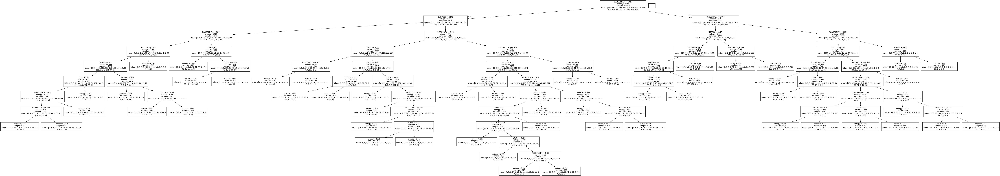

In [ ]:
visualize_tree(dt_best_classifier, md=20, width=2000)

In [ ]:
dt_best_classifier.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.007,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.01,
 'random_state': None,
 'splitter': 'best'}

In [ ]:
dt_best_classifier.get_depth()


11

In [ ]:
dt_best_classifier.get_n_leaves()

52

In [ ]:
scores = cross_val_score(dt_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.3467498923805424,
 0.3471803702109341,
 0.34136891950064574,
 0.33512699095996556,
 0.3355574687903573]

In [ ]:
dt_best_classifier.score(X_train, y_train)

0.3690260914492379

In [ ]:
y_train_pred = dt_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [ ]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.3690260914492379

In [ ]:
log_loss(y_train, dt_best_classifier.predict_proba(X_train))

1.776843674234063

In [ ]:
y_test

0       R
1       Q
2       M
3       Q
4       F
       ..
5158    M
5159    J
5160    O
5161    H
5162    M
Name: ACTIVITY, Length: 5163, dtype: object

In [ ]:
y_test_pred = dt_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     F
1     Q
2     M
3     F
4     F
...  ..
5158  M
5159  G
5160  G
5161  E
5162  M

[5163 rows x 1 columns]


In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
#                      y_pred=y_test_pred, normalize = 'true')
    
cm_act = pd.DataFrame(cm,
                      index=dt_best_classifier.classes_,
                      columns=dt_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,131,6,77,0,0,0,0,0,0,0,1,0,66,0,11,0,0,0
jogging,14,268,12,0,0,0,1,0,0,0,0,0,4,0,0,0,0,0
stairs,65,7,124,0,0,0,0,0,0,0,0,0,53,0,19,0,0,0
sitting,1,2,4,72,17,22,18,26,20,0,44,13,0,3,3,32,5,7
standing,0,1,1,5,177,1,22,0,0,0,10,15,1,11,2,0,0,48
typing,2,1,3,42,31,68,16,7,12,0,25,17,5,1,1,25,3,9
brushing teeth,2,0,4,34,29,14,103,6,16,0,20,20,5,8,2,4,13,14
eating soup,0,0,0,33,12,20,41,58,20,0,44,21,3,4,1,8,4,17
eating chips,2,1,1,38,14,9,35,11,50,0,38,17,1,3,2,28,20,12
eating pasta,0,0,0,15,27,28,24,25,22,0,52,28,3,6,0,13,16,10


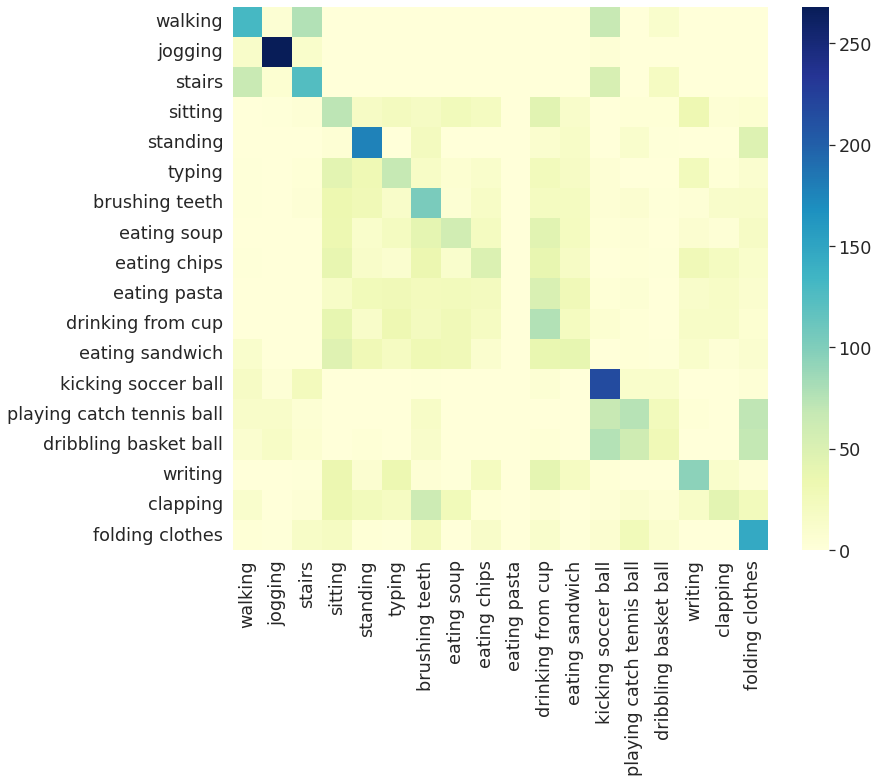

In [ ]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
_ = sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [ ]:
sns.set(font_scale=1.2)

In [ ]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.448630
jogging,0.896321
stairs,0.462687
sitting,0.249135
standing,0.602041
typing,0.253731
brushing teeth,0.350340
eating soup,0.202797
eating chips,0.177305
eating pasta,0.000000


In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.46      0.45      0.46       292
           B       0.82      0.90      0.86       299
           C       0.44      0.46      0.45       268
           D       0.17      0.25      0.21       289
           E       0.46      0.60      0.52       294
           F       0.25      0.25      0.25       268
           G       0.24      0.35      0.28       294
           H       0.27      0.20      0.23       286
           I       0.24      0.18      0.20       282
           J       0.00      0.00      0.00       269
           K       0.19      0.26      0.22       301
           L       0.18      0.14      0.16       283
           M       0.41      0.72      0.53       299
           O       0.33      0.26      0.29       290
           P       0.23      0.10      0.14       287
           Q       0.38      0.34      0.35       283
           R       0.31      0.14      0.20       291
           S       0.32    

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.34282393957001744

In [ ]:
log_loss(y_test, dt_best_classifier.predict_proba(X_test))


2.0878443587653455

# Random Forest Classification Model:

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GroupKFold
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_classifier = RandomForestClassifier(**dt_model_gs.best_params_)

In [ ]:
my_param_grid = {'bootstrap': [True], 
                 'n_estimators': [50, 100, 200], 
                 'oob_score': [True, False], 
                 'warm_start': [True, False]}

In [ ]:
rf_model_gs = GridSearchCV(estimator = rf_classifier, 
                           param_grid = my_param_grid, 
                           scoring = 'accuracy',
                           cv = my_cv)

In [ ]:
rf_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             estimator=RandomForestClassifier(criterion='entropy',
                                              min_impurity_decrease=0.007,
                                              min_samples_leaf=6,
                                              min_weight_fraction_leaf=0.01),
             param_grid={'bootstrap': [True], 'n_estimators': [50, 100, 200],
                         'oob_score': [True, False],
                         'warm_start': [True, False]},
             scoring='accuracy')

In [ ]:
rf_best_classifier = rf_model_gs.best_estimator_

In [ ]:
rf_model_gs.cv_results_

{'mean_fit_time': array([ 5.65788722,  7.20247798,  6.56494823,  5.53546233, 11.4862607 ,
        11.42305622, 11.00747132, 10.93291574, 22.69429426, 22.28553438,
        22.20111222, 21.80464973]),
 'std_fit_time': array([0.50366164, 2.61886335, 1.51123696, 0.40906671, 0.05188284,
        0.75285319, 0.30390344, 0.35306342, 0.74688188, 0.47248174,
        0.59119569, 0.52942374]),
 'mean_score_time': array([0.0385839 , 0.04972186, 0.04569573, 0.04053221, 0.07382045,
        0.07282505, 0.07354317, 0.07307439, 0.13950963, 0.13944874,
        0.14281464, 0.13582678]),
 'std_score_time': array([0.00119476, 0.01198809, 0.00988444, 0.00403263, 0.00403924,
        0.00522093, 0.00741686, 0.00524652, 0.01582574, 0.01126071,
        0.01228309, 0.00363833]),
 'param_bootstrap': masked_array(data=[True, True, True, True, True, True, True, True, True,
                    True, True, True],
              mask=[False, False, False, False, False, False, False, False,
                    False, Fal

In [ ]:
rf_best_classifier.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.007,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.01,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': True}

In [ ]:
scores = cross_val_score(rf_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.45092552733534225,
 0.4397331037451571,
 0.44726646577701246,
 0.4483426603529918,
 0.44726646577701246]

In [ ]:
y_train_pred = rf_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [ ]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.48307930767243606

In [ ]:
log_loss(y_train, dt_best_classifier.predict_proba(X_train))

1.776843674234063

In [ ]:
y_test

0       R
1       Q
2       M
3       Q
4       F
       ..
5158    M
5159    J
5160    O
5161    H
5162    M
Name: ACTIVITY, Length: 5163, dtype: object

In [ ]:
y_test_pred = rf_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     R
1     Q
2     B
3     Q
4     F
...  ..
5158  M
5159  J
5160  S
5161  D
5162  M

[5163 rows x 1 columns]


In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
#                      y_pred=y_test_pred, normalize = 'true')
    
cm_act = pd.DataFrame(cm,
                      index=rf_best_classifier.classes_,
                      columns=rf_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,187,31,59,0,0,0,0,0,0,0,0,0,13,0,1,0,0,1
jogging,30,261,6,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
stairs,80,17,144,0,0,0,0,0,0,0,0,0,19,0,8,0,0,0
sitting,2,1,3,99,25,17,7,6,5,2,53,3,1,0,4,23,28,10
standing,2,0,0,0,225,1,1,0,7,0,1,0,1,5,4,1,0,46
typing,1,0,2,10,40,87,0,4,13,5,26,1,5,4,3,26,21,20
brushing teeth,1,0,1,0,48,2,107,3,12,4,27,3,12,2,3,14,29,26
eating soup,0,0,0,33,22,12,23,43,11,5,55,9,5,2,5,10,28,23
eating chips,4,0,0,6,35,10,18,3,81,12,22,3,4,1,3,20,35,25
eating pasta,0,0,0,15,29,11,10,8,2,77,52,3,3,1,3,13,26,16


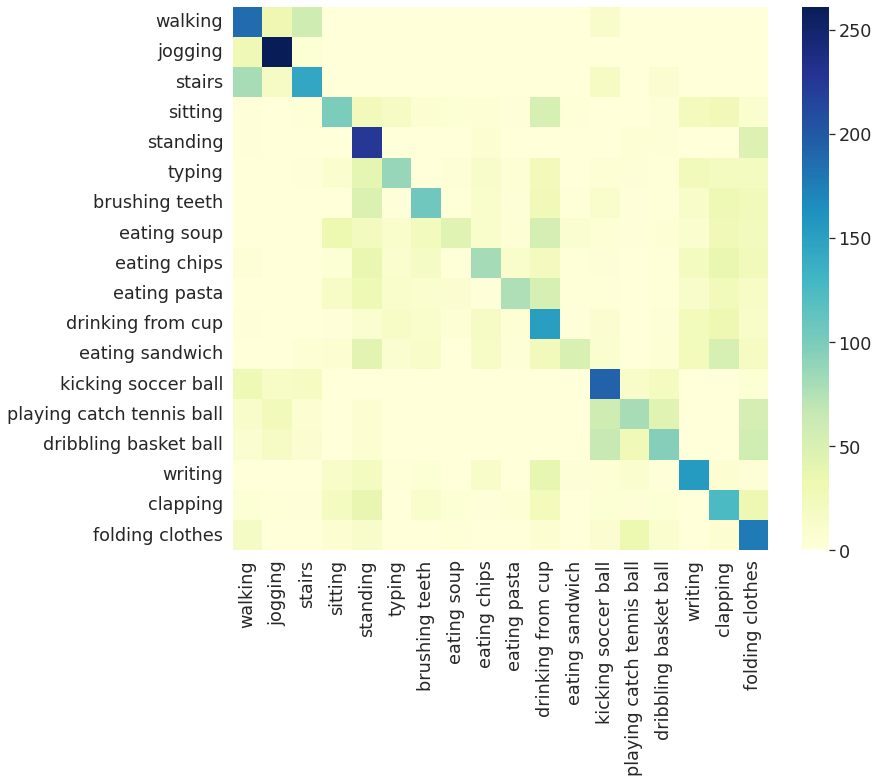

In [ ]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
_ = sns.heatmap(cm_act, cmap="YlGnBu")

In [ ]:
sns.set(font_scale=1.2)

In [ ]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.640411
jogging,0.872910
stairs,0.537313
sitting,0.342561
standing,0.765306
typing,0.324627
brushing teeth,0.363946
eating soup,0.150350
eating chips,0.287234
eating pasta,0.286245


In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.49      0.64      0.55       292
           B       0.70      0.87      0.78       299
           C       0.56      0.54      0.55       268
           D       0.46      0.34      0.39       289
           E       0.40      0.77      0.53       294
           F       0.52      0.32      0.40       268
           G       0.51      0.36      0.43       294
           H       0.52      0.15      0.23       286
           I       0.45      0.29      0.35       282
           J       0.63      0.29      0.39       269
           K       0.31      0.50      0.38       301
           L       0.63      0.18      0.28       283
           M       0.46      0.65      0.54       299
           O       0.43      0.28      0.34       290
           P       0.43      0.33      0.38       287
           Q       0.50      0.54      0.52       283
           R       0.32      0.43      0.37       291
           S       0.33    

In [ ]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.452643811737362

In [ ]:
log_loss(y_test, dt_best_classifier.predict_proba(X_test))


2.0878443587653455

## Logistic Regression Model: 

In [ ]:
from sklearn.linear_model import LogisticRegression
import warnings

warnings.filterwarnings('ignore')
#%matplotlib inline

In [ ]:
lr_classifier = LogisticRegression(verbose = 0)

In [ ]:
my_param_grid = {'C': [10, 50, 100, 200]}

In [ ]:
lr_model_gs = GridSearchCV(estimator=lr_classifier, 
                           param_grid=my_param_grid, 
                           cv=my_cv, 
                           scoring = 'accuracy')

In [ ]:
lr_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             estimator=LogisticRegression(),
             param_grid={'C': [10, 50, 100, 200]}, scoring='accuracy')

In [ ]:
lr_best_classifier = lr_model_gs.best_estimator_

In [ ]:
lr_model_gs.cv_results_

{'mean_fit_time': array([2.02601051, 2.0715693 , 1.71189146, 2.17230582]),
 'std_fit_time': array([0.54538644, 0.58774384, 0.01115193, 0.50352002]),
 'mean_score_time': array([0.01046915, 0.01226177, 0.00851994, 0.01310449]),
 'std_score_time': array([3.52226467e-03, 4.51526618e-03, 8.26954970e-05, 5.65064930e-03]),
 'param_C': masked_array(data=[10, 50, 100, 200],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 10}, {'C': 50}, {'C': 100}, {'C': 200}],
 'split0_test_score': array([0.38269479, 0.37968145, 0.37860525, 0.38355575]),
 'split1_test_score': array([0.36396901, 0.36353853, 0.36181662, 0.36375377]),
 'split2_test_score': array([0.36439948, 0.36805854, 0.36698235, 0.36482996]),
 'split3_test_score': array([0.37085665, 0.37300904, 0.37193285, 0.37408523]),
 'split4_test_score': array([0.38075764, 0.3816186 , 0.3805424 , 0.3816186 ]),
 'mean_test_score': array([0.37253551, 0.37318123, 0.37197589, 0.37356866]),


In [ ]:
lr_best_classifier.get_params()

{'C': 200,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [ ]:
scores = cross_val_score(lr_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.3751614291863969,
 0.3790357296599225,
 0.3788204907447266,
 0.36547567800258285,
 0.36827378390012916]

In [ ]:
y_train_pred=lr_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [ ]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.3860759493670886

In [ ]:
log_loss(y_train, lr_best_classifier.predict_proba(X_train))

1.8343344399044366

In [ ]:
y_test

0       R
1       Q
2       M
3       Q
4       F
       ..
5158    M
5159    J
5160    O
5161    H
5162    M
Name: ACTIVITY, Length: 5163, dtype: object

In [ ]:
y_test_pred = lr_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     Q
1     Q
2     M
3     Q
4     J
...  ..
5158  M
5159  G
5160  E
5161  E
5162  M

[5163 rows x 1 columns]


In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
 #                     y_pred=y_test_pred, normalize = 'true')
    
cm_act = pd.DataFrame(cm,
                      index=lr_best_classifier.classes_,
                      columns=lr_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,201,2,49,0,0,0,1,0,0,0,0,0,24,5,4,0,5,1
jogging,17,268,11,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
stairs,50,6,148,0,0,0,0,0,0,0,0,0,31,8,19,0,5,1
sitting,1,1,3,82,18,9,11,16,11,17,32,29,0,1,4,22,23,9
standing,1,0,0,1,186,6,10,1,9,9,0,7,2,6,5,17,3,31
typing,0,0,0,16,35,41,12,7,23,16,46,11,3,3,1,30,17,7
brushing teeth,0,0,3,19,21,9,76,17,4,17,16,24,0,8,9,21,24,26
eating soup,1,0,0,33,26,17,24,39,27,14,34,15,1,0,0,19,26,10
eating chips,0,1,1,22,23,24,29,11,71,20,22,18,2,0,0,15,14,9
eating pasta,0,0,1,12,22,32,21,29,19,12,39,34,1,1,0,20,17,9


<AxesSubplot:>

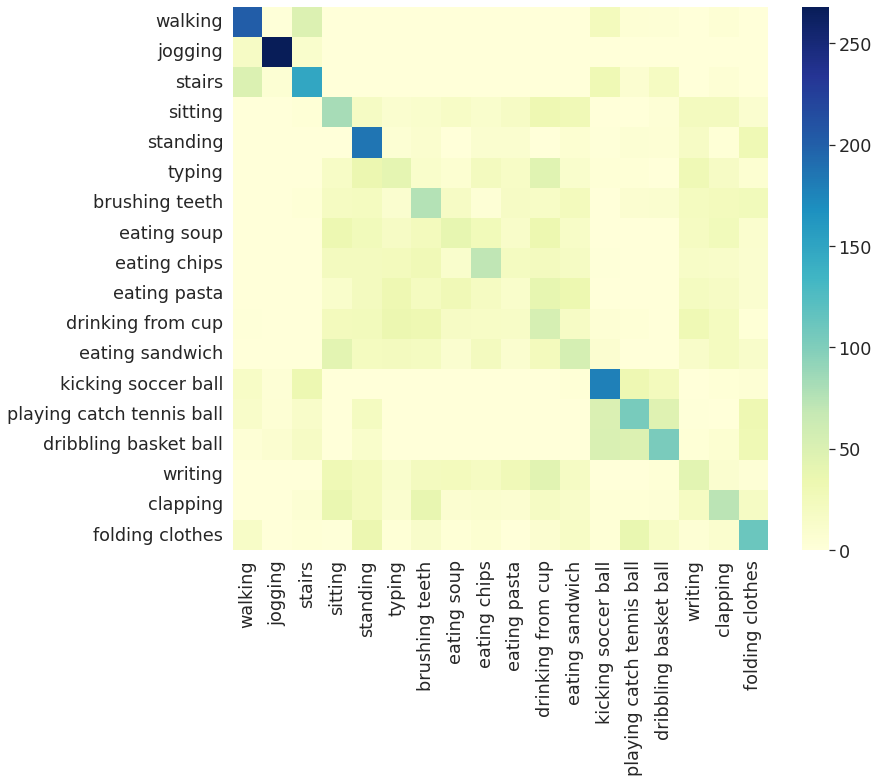

In [ ]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(cm_act, cmap="YlGnBu")

In [ ]:
sns.set(font_scale=1.2)

In [ ]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.688356
jogging,0.896321
stairs,0.552239
sitting,0.283737
standing,0.632653
typing,0.152985
brushing teeth,0.258503
eating soup,0.136364
eating chips,0.251773
eating pasta,0.044610


In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.62      0.69      0.65       292
           B       0.91      0.90      0.90       299
           C       0.51      0.55      0.53       268
           D       0.26      0.28      0.27       289
           E       0.38      0.63      0.47       294
           F       0.19      0.15      0.17       268
           G       0.24      0.26      0.25       294
           H       0.22      0.14      0.17       286
           I       0.30      0.25      0.27       282
           J       0.07      0.04      0.06       269
           K       0.16      0.18      0.17       301
           L       0.21      0.19      0.20       283
           M       0.49      0.60      0.54       299
           O       0.40      0.36      0.38       290
           P       0.43      0.36      0.39       287
           Q       0.16      0.15      0.16       283
           R       0.26      0.25      0.26       291
           S       0.35    

In [ ]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.357544063528956

In [ ]:
log_loss(y_test, lr_best_classifier.predict_proba(X_test))

1.903887130471928

## K Nearest Neighbors Model: 

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn_classifier = KNeighborsClassifier()

In [ ]:
my_param_grid = {'n_neighbors': [5, 10, 20], 'leaf_size': [20, 30, 40]}

In [ ]:
knn_model_gs = GridSearchCV(estimator = knn_classifier, 
                            param_grid = my_param_grid,
                            cv = my_cv, 
                            scoring ='accuracy')

In [ ]:
knn_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             estimator=KNeighborsClassifier(),
             param_grid={'leaf_size': [20, 30, 40], 'n_neighbors': [5, 10, 20]},
             scoring='accuracy')

In [ ]:
knn_best_classifier = knn_model_gs.best_estimator_

In [ ]:
print(knn_model_gs.best_params_)

{'leaf_size': 20, 'n_neighbors': 5}


In [ ]:
knn_model_gs.cv_results_

{'mean_fit_time': array([0.02151957, 0.01795907, 0.01921105, 0.01629515, 0.02359896,
        0.01691098, 0.03979745, 0.02081666, 0.01803484]),
 'std_fit_time': array([0.00700477, 0.00165897, 0.00259969, 0.00037166, 0.00642341,
        0.0008533 , 0.01520481, 0.00341732, 0.00317975]),
 'mean_score_time': array([2.45650072, 1.137431  , 1.33557577, 1.12656407, 1.31325483,
        1.23706136, 2.0341753 , 1.44570298, 1.19190331]),
 'std_score_time': array([1.58343337, 0.05839785, 0.22868368, 0.05711905, 0.21267394,
        0.19201258, 0.6490059 , 0.35657412, 0.17133307]),
 'param_leaf_size': masked_array(data=[20, 20, 20, 30, 30, 30, 40, 40, 40],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_n_neighbors': masked_array(data=[5, 10, 20, 5, 10, 20, 5, 10, 20],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_va

In [ ]:
knn_best_classifier.get_params()

{'algorithm': 'auto',
 'leaf_size': 20,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [ ]:
scores = cross_val_score(knn_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.7382694791218253,
 0.7380542402066294,
 0.7371932845458459,
 0.7486009470512268,
 0.741928540680155]

In [ ]:
y_train_pred=knn_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [ ]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.8398992508395763

In [ ]:
y_test_pred = knn_best_classifier.predict(X_test)

In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
    
cm_act = pd.DataFrame(cm,
                      index = knn_best_classifier.classes_,
                      columns = knn_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,281,0,8,0,0,0,0,0,0,0,0,0,1,0,2,0,0,0
jogging,12,280,2,0,0,0,0,0,0,0,0,0,1,2,1,0,1,0
stairs,13,6,233,0,0,0,0,0,0,0,0,0,12,1,2,0,0,1
sitting,1,2,4,214,3,12,6,11,4,3,10,2,1,0,0,9,4,3
standing,1,0,0,1,234,2,3,7,0,4,1,5,4,8,6,4,5,9
typing,1,0,0,7,15,193,5,4,6,6,4,5,1,4,2,11,1,3
brushing teeth,1,0,1,7,2,4,238,3,4,3,5,6,1,6,2,5,5,1
eating soup,0,0,0,13,5,5,6,202,4,14,13,11,1,3,2,1,4,2
eating chips,0,0,1,13,4,12,10,9,175,12,17,7,0,1,1,5,10,5
eating pasta,0,0,2,5,5,6,10,19,15,170,11,14,2,1,1,4,1,3


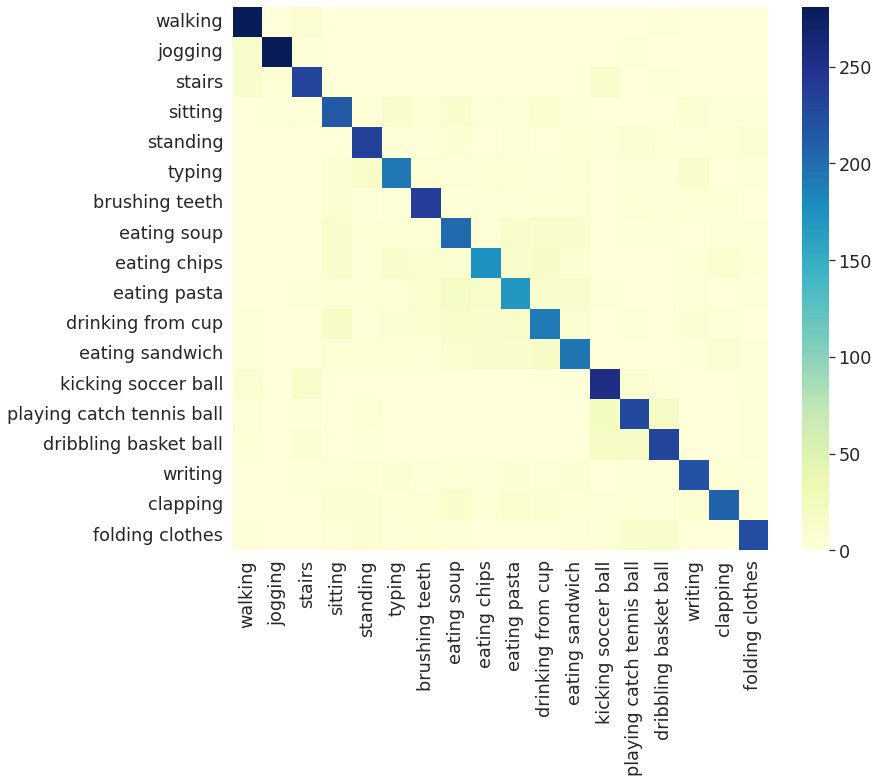

In [ ]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
_ = sns.heatmap(cm_act, cmap="YlGnBu")

In [ ]:
sns.set(font_scale=1.2)

In [ ]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.962329
jogging,0.936455
stairs,0.869403
sitting,0.740484
standing,0.795918
typing,0.720149
brushing teeth,0.809524
eating soup,0.706294
eating chips,0.620567
eating pasta,0.631970


In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.83      0.96      0.89       292
           B       0.96      0.94      0.95       299
           C       0.83      0.87      0.85       268
           D       0.72      0.74      0.73       289
           E       0.76      0.80      0.78       294
           F       0.73      0.72      0.73       268
           G       0.78      0.81      0.79       294
           H       0.68      0.71      0.69       286
           I       0.73      0.62      0.67       282
           J       0.66      0.63      0.64       269
           K       0.68      0.64      0.66       301
           L       0.71      0.69      0.70       283
           M       0.79      0.85      0.82       299
           O       0.76      0.79      0.77       290
           P       0.79      0.80      0.80       287
           Q       0.79      0.78      0.78       283
           R       0.80      0.71      0.75       291
           S       0.83    

In [ ]:
accuracy_score(y_true = y_test, y_pred = y_test_pred)

0.7693201626961069


Models mean prediction accuracy scores summary:
Decision Tree: 0.33

Random Forest: 0.44

Logistic Regression: 0.38

KNN: 0.77

# Insights & Conclusions:
1) The K Nearest Neighbor classifier has prooved to provide substantial higher prediction accuracy than the rest of the models (overall mean accuracy ~0.77 on test set) in this case.

2) The analysis demonstrated typical differentiation of detection accuracy accross the various physical activities:

The highest detection accuracy is for Jogging: ~0.95 walking, stairs, kicking soccer ball, dribbling basket ball also have high accuracies: ~0.8 On the other hand, the eating related activities have lower detection accuracies: ~0.6 However, this lower accuracy is still surprisingly significant ! (10 times the neutral guess accuracy, 1/18), considering the fact that the smartphone was placed inside the participant's pants leg pocket !

3) The accuracy profiles are consistent with the visual clustering patterns seen in the three dimentional features visualization plots & t-SNE, in particular, the jogging points clusters where exceptionally noticable and distinct.

4) Possible explanations of the above observations:

The Jogging etc. where highly predictable because they where the most intense and strongly related to leg movement (the phone was inside the leg pocket)

The suprisingly significant accuracy rates of identifying eatings activites by the phone might be explained by the posture sitting changes characterizing such activities:

The fact that the accelerometer measures also the gravity vector, could supply additional implied information pertaining the orientation of the device and, therefore, as to the posture mode (standing/sitting) of the participant, which could contribute to the accuracy detection ability.

# LSTM

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
import numpy as np

In [ ]:
# define LSTM model
def create_lstm_model(hidden_units, input_shape):
    model = Sequential()
    model.add(LSTM(hidden_units, input_shape=input_shape))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


In [ ]:
# create KerasClassifier wrapper for scikit-learn compatibility
lstm_classifier = KerasClassifier(build_fn=create_lstm_model, verbose=0)

In [ ]:
# define hyperparameters for grid search
hidden_units = [32, 64, 128]
batch_size = [16, 32]
epochs = [10, 20]
param_grid = dict(hidden_units=hidden_units, batch_size=batch_size, epochs=epochs)

# create grid search object
grid = GridSearchCV(estimator=lstm_classifier, param_grid=param_grid, cv=3)

In [ ]:
data_phone_accel_sum.head(-1)

,user,activity,time,x,y,z
0,1602,A,99019527581830,-0.923737,-11.386169,8.799728
1,1602,A,99019577935834,-2.185410,-12.316559,8.982025
2,1602,A,99019628289837,4.615936,-6.947418,1.984863
3,1602,A,99019678643841,6.473099,-11.660782,-2.848984
4,1602,A,99019728997845,-2.869598,-3.154541,-8.561188
...,...,...,...,...,...,...
64824,1638,S,1137431447727363,-6.304232,-0.555904,-0.150535
64825,1638,S,1137431497717573,0.131382,-6.234950,-4.577414
64826,1638,S,1137431547707783,4.316446,-5.686678,-5.468058
64827,1638,S,1137431597697993,4.893449,-7.752874,-5.401020


In [ ]:
data_phone_accel_sum.shape

(4804403, 6)

In [ ]:
data_phone_accel_sum['user'].nunique()

51

In [ ]:
df_train_ls = data_phone_accel_sum[data_phone_accel_sum['user'] <= 1635]
df_test_ls = data_phone_accel_sum[data_phone_accel_sum['user'] > 1635]

In [ ]:
df_test_ls.shape,df_train_ls.shape

((1746963, 6), (3057440, 6))

In [ ]:
from sklearn.preprocessing import RobustScaler
scale_columns = ['x', 'y', 'z']

scaler = RobustScaler()

scaler = scaler.fit(df_train_ls[scale_columns])

df_train_ls.loc[:, scale_columns] = scaler.transform(
  df_train_ls[scale_columns].to_numpy()
)

df_test_ls.loc[:, scale_columns] = scaler.transform(
  df_test_ls[scale_columns].to_numpy()
)

In [ ]:
def create_dataset(X, y, n_time_steps, step):
    Xs, ys = [], []
    for i in range(0, len(X) - n_time_steps, step):
        v = X.iloc[i:(i + n_time_steps)].values
        labels = y.iloc[i: i + n_time_steps]
        Xs.append(v)
        ys.append(stats.mode(labels)[0][0])
    return np.array(Xs), np.array(ys).reshape(-1, 1)

In [ ]:
X_train_ls, y_train_ls = create_dataset(
    df_train_ls[['x', 'y', 'z']],
    df_train_ls.activity,
    n_time_steps,
    step
)

X_test_ls, y_test_ls = create_dataset(
    df_test_ls[['x', 'y', 'z']],
    df_test_ls.activity,
    n_time_steps,
    step
)

In [ ]:
X_train_ls.shape,y_train_ls.shape

((30573, 200, 3), (30573, 1))

In [ ]:
X_test_ls.shape,y_test_ls.shape

((17468, 200, 3), (17468, 1))

In [ ]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(handle_unknown='ignore', sparse=False)

enc = enc.fit(y_train_ls)

y_train_ls = enc.transform(y_train_ls)
y_test_ls = enc.transform(y_test_ls)

In [ ]:
model = keras.Sequential()
model.add(
    keras.layers.Bidirectional(
      keras.layers.LSTM(
          units=32,
          input_shape=[X_train_ls.shape[1], X_train_ls.shape[2]]
      )
    )
)
model.add(keras.layers.Dropout(rate=0.2))
model.add(keras.layers.Dense(units=32, activation='relu'))
model.add(keras.layers.Dense(y_train_ls.shape[1], activation='softmax'))

model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['acc']
)

In [ ]:

history = model.fit(
    X_train_ls, y_train_ls,
    epochs=20,
    batch_size=128,
    validation_split=0.1,
    shuffle=False
)

Epoch 1/20
215/215 [==============================] - 42s 173ms/step - loss: 2.8535 - acc: 0.0739 - val_loss: 2.8123 - val_acc: 0.0827
Epoch 2/20
215/215 [==============================] - 36s 167ms/step - loss: 2.7450 - acc: 0.0910 - val_loss: 2.7627 - val_acc: 0.0981
Epoch 3/20
215/215 [==============================] - 36s 166ms/step - loss: 2.6929 - acc: 0.0959 - val_loss: 2.7060 - val_acc: 0.1161
Epoch 4/20
215/215 [==============================] - 36s 168ms/step - loss: 2.6624 - acc: 0.1055 - val_loss: 2.7036 - val_acc: 0.1413
Epoch 5/20
215/215 [==============================] - 37s 170ms/step - loss: 2.6539 - acc: 0.1082 - val_loss: 2.6552 - val_acc: 0.0984
Epoch 6/20
215/215 [==============================] - 36s 169ms/step - loss: 2.6163 - acc: 0.1151 - val_loss: 2.6679 - val_acc: 0.1024
Epoch 7/20
215/215 [==============================] - 36s 166ms/step - loss: 2.6011 - acc: 0.1184 - val_loss: 2.7236 - val_acc: 0.0896
Epoch 8/20
215/215 [==============================] - 3

In [ ]:
model.evaluate(X_test_ls, y_test_ls)

546/546 [==============================] - 16s 28ms/step - loss: 2.5573 - acc: 0.1500


[2.557264804840088, 0.15004579722881317]

# RNN

In [ ]:
model = keras.Sequential()
model.add(
    keras.layers.Bidirectional(
      keras.layers.SimpleRNN(
          units=32,
          input_shape=[X_train_ls.shape[1], X_train_ls.shape[2]]
      )
    )
)
model.add(keras.layers.Dropout(rate=0.2))
model.add(keras.layers.Dense(units=32, activation='relu'))
model.add(keras.layers.Dense(y_train_ls.shape[1], activation='softmax'))

model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['acc']
)

In [ ]:
history = model.fit(
    X_train_ls, y_train_ls,
    epochs=20,
    batch_size=32,
    validation_split=0.1,
    shuffle=True
)

Epoch 1/20
860/860 [==============================] - 116s 135ms/step - loss: 2.1652 - acc: 0.2389 - val_loss: 2.4706 - val_acc: 0.1465
Epoch 2/20
860/860 [==============================] - 115s 133ms/step - loss: 2.1002 - acc: 0.2552 - val_loss: 2.4199 - val_acc: 0.1684
Epoch 3/20
860/860 [==============================] - 115s 134ms/step - loss: 2.0220 - acc: 0.2759 - val_loss: 2.4712 - val_acc: 0.1766
Epoch 4/20
860/860 [==============================] - 115s 133ms/step - loss: 1.9744 - acc: 0.2920 - val_loss: 2.5673 - val_acc: 0.1769
Epoch 5/20
860/860 [==============================] - 115s 134ms/step - loss: 1.9339 - acc: 0.3051 - val_loss: 2.6583 - val_acc: 0.1969
Epoch 6/20
860/860 [==============================] - 114s 132ms/step - loss: 1.8718 - acc: 0.3257 - val_loss: 2.5667 - val_acc: 0.2260
Epoch 7/20
860/860 [==============================] - 113s 132ms/step - loss: 1.8395 - acc: 0.3365 - val_loss: 2.6952 - val_acc: 0.1805
Epoch 8/20
860/860 [============================

In [ ]:
model.evaluate(X_test_ls, y_test_ls)

546/546 [==============================] - 16s 29ms/step - loss: 3.1492 - acc: 0.1855


[3.149200439453125, 0.18553927540779114]